In [1]:
import time;
import os
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import matplotlib.image as mpimg
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (2.5,2.5)

import itertools
import upsetplot as us
import seaborn as sns
import scipy
import scipy.stats as ss
import statsmodels.api as sm
import statsmodels.formula.api as smf
from tqdm import tqdm

import upsetplot as us
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="upsetplot")

print(mpl.__version__, pd.__version__)

3.10.9 2.3.3


In [2]:
anno_f = 'release/ml-burden.variants.parquet'
sumstat_f = 'release/ml-burden.sumstats.parquet'

s_het_f = 'data/s_het_estimates.genebayes.tsv'
loeuf_f = 'data/gnomad.v4.1.constraint_metrics.tsv'

scores = ['-esm1b_pred', 'am_pathogenicity', '-gpn', 'cadd16_phred', 'cadd17_phred']
ANNO_ORDER = ['ESM1B','AM','GPN','CADD16','CADD17']
TEST_ORDER1 = ['BURDEN','SKAT-O','SKAT','ACATV']
TEST_ORDER2 = ['COAST_O','BURDEN-SBAT','BURDEN-ACAT','SKATO-ACAT','ACATV-ACAT','GENE_P']
TEST_ORDER = TEST_ORDER1 + TEST_ORDER2
GROUP_ORDER = ['Ocular','Pulmonary','Anthropometric','Height']

# Variant scoring

In [3]:
vs = pd.read_parquet(anno_f)

# this polarizes these two to be like the other three
vs['-gpn'] = -vs['gpn']
vs['-esm1b_pred'] = -vs['esm1b_pred']

# convenience
vs['mis'] = vs['conseq'].str.contains('missense_variant')
vs['syn'] = vs['conseq'].str.contains('synonymous_variant')
vs['mis_str'] = vs['mis'].apply(lambda mis: 'Missense' if mis else 'Synonymous')

display(
    vs['conseq'].value_counts(), 
    vs[['mis','syn']].value_counts(), 
    vs.columns, 
    vs.tail()
)

conseq
missense_variant                                    6163737
synonymous_variant                                  3040657
missense_variant,splice_region_variant               173567
splice_region_variant,synonymous_variant              80411
splice_donor_5th_base_variant,synonymous_variant          2
splice_donor_region_variant,synonymous_variant            1
missense_variant,splice_donor_5th_base_variant            1
missense_variant,splice_donor_region_variant              1
start_lost,synonymous_variant                             1
Name: count, dtype: int64

mis    syn  
True   False    6337306
False  True     3121072
Name: count, dtype: int64

Index(['chrom', 'pos', 'varid', 'ref', 'alt', 'maf', 'obs_ct', 'transcript_id',
       'aa', 'am_pathogenicity', 'am_class', 'gene_id', 'feature', 'conseq',
       'biotype', 'symbol', 'impact', 'gpn', 'cadd16_raw', 'cadd16_phred',
       'cadd17_raw', 'cadd17_phred', 'esm1b_pred', 'gene_name', 'TSS',
       'am_annot', 'esm_annot', 'gpn_annot', 'cadd16_annot', 'cadd17_annot',
       'coast_am_score', 'coast_esm_score', 'coast_gpn_score',
       'coast_cadd16_score', 'coast_cadd17_score', '-gpn', '-esm1b_pred',
       'mis', 'syn', 'mis_str'],
      dtype='object')

,chrom,pos,varid,ref,alt,maf,obs_ct,transcript_id,aa,am_pathogenicity,...,coast_am_score,coast_esm_score,coast_gpn_score,coast_cadd16_score,coast_cadd17_score,-gpn,-esm1b_pred,mis,syn,mis_str
9458432,22,50777967,22_50777967_A_C,A,C,0.000001,821052,ENST00000395598,F41C,0.9782,...,3,3,3,3,3,9.81,8.894,True,False,Missense
9458433,22,50777972,22_50777972_C_T,C,T,0.000000,821054,ENST00000354869,None,0.0000,...,1,1,2,2,2,3.46,-0.000,False,True,Synonymous
9458434,22,50777972,22_50777972_C_A,C,A,0.000005,821054,ENST00000395598,E39D,0.9358,...,3,2,3,3,3,9.82,7.108,True,False,Missense
9458435,22,50777975,22_50777975_C_T,C,T,0.000015,821054,ENST00000395598,M38I,0.6980,...,3,1,3,3,3,8.78,2.959,True,False,Missense
9458436,22,50777977,22_50777977_T_C,T,C,0.000004,821054,ENST00000395598,M38V,0.1561,...,1,2,2,2,2,4.67,3.078,True,False,Missense


In [4]:
v_uniq = pd.DataFrame(index = vs['varid'].unique())

vs_gbv = vs.groupby('varid')
cs2lab = dict(zip(range(1,4), ['ben','mod','del']))

for score in tqdm(['cadd16','cadd17','am','esm','gpn']):
    v_uniq[score.upper() + ('1B' if score == 'esm' else '')] = vs_gbv['coast_' + score + '_score'].max().apply(cs2lab.get)

v_uniq['maf'] = vs_gbv['maf'].first()
v_uniq['mis'] = vs_gbv['mis'].max()
v_uniq['mis_str'] = v_uniq['mis'].apply(lambda mis: 'Missense' if mis else 'Synonymous')

display(v_uniq.head(), v_uniq.shape)

100%|██████████| 5/5 [00:21<00:00,  4.20s/it]


,CADD16,CADD17,AM,ESM1B,GPN,maf,mis,mis_str
1_925946_C_G,del,del,del,del,del,0.000000,True,Missense
1_925947_C_T,mod,mod,ben,ben,mod,0.000009,False,Synonymous
1_925948_A_C,del,del,del,del,del,0.000062,True,Missense
1_925949_A_C,del,del,del,del,del,0.000000,True,Missense
1_925950_G_C,del,del,del,del,del,0.000001,True,Missense


(9335541, 8)

In [5]:
v_uniq[ANNO_ORDER] = vs.set_index('varid')[scores].abs().groupby('varid').max()

ANNO_RANKS = [A + '_RANK' for A in ANNO_ORDER]

vs[ANNO_RANKS] = vs.query('mis')[scores].rank()
vs[ANNO_RANKS] /= vs[ANNO_RANKS].max()

v_uniq[ANNO_RANKS] = v_uniq.loc[v_uniq['mis'], ANNO_ORDER].rank()
v_uniq[ANNO_RANKS] /= v_uniq[ANNO_RANKS].max()

v_rank_corr = vs[ANNO_RANKS].corr(method='spearman')

mean_gene_scores = vs.query('mis').groupby('gene_name')[ANNO_RANKS].mean()
mean_gene_score_corrs = mean_gene_scores.corr(method='spearman')

in_gene_corr = vs.query('mis').groupby('gene_id')[scores].corr(method='spearman')
mean_in_gene_corr = in_gene_corr.groupby(level=1).median().loc[scores,scores]

display(
    mean_gene_score_corrs,
    mean_in_gene_corr
)

,ESM1B_RANK,AM_RANK,GPN_RANK,CADD16_RANK,CADD17_RANK
ESM1B_RANK,1.000000,0.478026,0.380729,0.435742,0.476667
AM_RANK,0.478026,1.000000,0.685230,0.695902,0.704168
GPN_RANK,0.380729,0.685230,1.000000,0.916205,0.947411
CADD16_RANK,0.435742,0.695902,0.916205,1.000000,0.966092
CADD17_RANK,0.476667,0.704168,0.947411,0.966092,1.000000


,-esm1b_pred,am_pathogenicity,-gpn,cadd16_phred,cadd17_phred
-esm1b_pred,1.000000,0.668408,0.524701,0.627968,0.659151
am_pathogenicity,0.668408,1.000000,0.715842,0.715908,0.714149
-gpn,0.524701,0.715842,1.000000,0.741384,0.724726
cadd16_phred,0.627968,0.715908,0.741384,1.000000,0.943808
cadd17_phred,0.659151,0.714149,0.724726,0.943808,1.000000


In [6]:
ANNO_T = {
    'AM': 0.564,
    'ESM1B': 7.999,
    'GPN': 7.999,
    'CADD16': 20,
    'CADD17': 20,
}

# Sumstats

In [7]:
# summary stats
sumstats = pd.read_parquet(sumstat_f).dropna(subset=['anno'])

sumstats['anno'] = sumstats['anno'].str.upper()
sumstats['anno'] = sumstats['anno'].replace({'ESM':'ESM1B'})

pheno_groups = {
    'height': 'Height',
    'weight': 'Anthropometric',
    'bmi': 'Anthropometric',
    'fev1': 'Pulmonary',
    'fvc': 'Pulmonary',
    'fev1_fvc_ratio': 'Pulmonary',
    'iop-R': 'Ocular',
    'iop-L': 'Ocular',
    'iop-G-R': 'Ocular',
    'iop-G-L': 'Ocular',
    'ch-R': 'Ocular',
    'ch-L': 'Ocular',
    'crf-R': 'Ocular',
    'crf-L': 'Ocular'
}

sumstats['pheno_group'] = sumstats['pheno'].apply(pheno_groups.get)

sumstats.head(3)

,CHROM,GENPOS,GENE,gene_id,A1FREQ,N,TEST,BETA,SE,CHISQ,LOG10P,pheno,anno,mask,test_keys,pop_sample,pheno_group
0,1.0,925946.0,SAMD11,ENSG00000187634,NaN,282956,ADD-ACATV,NaN,NaN,0.801595,0.431075,fev1_fvc_ratio,CADD16,del,ACATV,related,Pulmonary
1,1.0,925946.0,SAMD11,ENSG00000187634,NaN,282956,ADD-SKAT,NaN,NaN,1.944740,0.787401,fev1_fvc_ratio,CADD16,del,SKAT,related,Pulmonary
2,1.0,925946.0,SAMD11,ENSG00000187634,NaN,282956,ADD-SKATO-ACAT,NaN,NaN,1.909740,0.777305,fev1_fvc_ratio,CADD16,del,SKAT-O,related,Pulmonary


In [8]:
p_star = 1e-4

sig_cts = sumstats.query(
    '(mask == "del" | mask == "bdm") & pop_sample == "unrelated"'
).groupby(
    ['pheno','test_keys','anno']
).apply(
    lambda x: (-x['LOG10P'] < np.log10(p_star)).sum(),
    include_groups = False,
).unstack(
    fill_value=0
)

sig_cts

anno                AM  CADD16  CADD17  ESM1B  GPN
pheno  test_keys                                  
bmi    ACATV         9      11      13      7    7
       ACATV-ACAT    9       8       9      8   10
       BURDEN        5      10      12      6    6
       BURDEN-ACAT   8       6       8      5    3
       BURDEN-SBAT   4       4       4      5    4
...                 ..     ...     ...    ...  ...
weight COAST_O       2       3       6      8    6
       GENE_P       22      18      17     23   22
       SKAT         11      21      22     14   11
       SKAT-O       12      22      25     15   17
       SKATO-ACAT   21      22      23     26   22

[140 rows x 5 columns]

In [9]:
s_het = pd.read_csv(s_het_f, sep='\t')
lower_s, upper_s = s_het.query('ensg.isin(@sumstats.gene_id)')['post_mean'].quantile([0.25, 0.75])
print(lower_s, upper_s)

s_het_d = dict(s_het[['ensg','post_mean']].values)
for df in [sumstats, vs]:
    df['s_het'] = df['gene_id'].apply(s_het_d.get)
    df['1/s_het'] = 1./df['s_het']
    df['s_het_high'] = (df['s_het'] > upper_s)
    df['s_het_low']  = (df['s_het'] < lower_s)

0.00216671 0.0489018


In [10]:
loeuf = pd.read_csv(loeuf_f, sep='\t')
lower_l, upper_l = loeuf.query('mane_select & gene_id.isin(@sumstats.gene_id)')['lof.oe_ci.upper'].quantile([0.25, 0.75])
print(lower_l, upper_l)

loeuf_d = dict(loeuf[['gene_id','lof.oe_ci.upper']].values)
for df in [sumstats, vs]:
    df['loeuf'] = df['gene_id'].apply(loeuf_d.get) 
    df['1/loeuf'] = 1./df['loeuf']
    df['loeuf_high'] = (df['loeuf'] > upper_l)
    df['loeuf_low']  = (df['loeuf'] < lower_l)

0.647 1.2767499999999998


## Perform ACAT 

This should take about ten minutes.

In [11]:
t = time.time()

if not os.path.exists('release/acat.parquet'):
    
    acat = sumstats.query(
        '(mask == "del" | mask == "bdm") & (pop_sample == "unrelated")'
    ).groupby(
        ['pheno','test_keys','gene_id']
    ).apply(
        lambda x: (0.5 - ( np.arctan(np.mean( np.tan(np.pi * (0.5 - 10**(-x['LOG10P']))) ) ) / np.pi )) < p_star,
        include_groups = False
    ).to_frame().groupby(
        ['pheno','test_keys']
    ).sum(
    ).unstack(
        fill_value=0
    )

    acat.to_parquet('release/acat.parquet')
else:
    acat = pd.read_parquet('release/acat.parquet')

display(
    acat, 
    time.time()-t
)

0                                                           \
test_keys      ACATV ACATV-ACAT BURDEN BURDEN-ACAT BURDEN-SBAT COAST_O GENE_P   
pheno                                                                           
bmi               10          9      7           7           6       6     11   
ch-L               2          4      5           7           6       2      9   
ch-R               6          5      5           3           3       3      5   
crf-L              5          5      8           6           3       4      9   
crf-R             10          5     10           5           6       5      8   
fev1              20         15     27          19          17      10     25   
fev1_fvc_ratio    20         21     17          13          13       4     22   
fvc               44         38     41          34          33      16     51   
height           153        187    190         151         129      40    222   
iop-G-L            4          4      3           4           6       4      4   
iop-G-R            5          4      5           6           3       1      4   
iop-L              1          1      1           2           3       1      3   
iop-R              2          2      3           3           2       1      2   
weight            19         20     21          18          21       8     21   

                                       
test_keys      SKAT SKAT-O SKATO-ACAT  
pheno                                  
bmi              15     15         16  
ch-L              3      5         10  
ch-R              2      4          4  
crf-L             4      7          8  
crf-R             8      8          6  
fev1             22     27         22  
fev1_fvc_ratio   22     24         29  
fvc              46     48         49  
height          170    212        231  
iop-G-L           6      5          3  
iop-G-R           6      5          3  
iop-L             1      1          1  
iop-R             2      2          2  
weight           23     22         25

0.0077250003814697266

In [12]:
(acat.droplevel(level=0, axis=1) / sig_cts.max(axis=1).unstack(level='test_keys'))[TEST_ORDER]

test_keys,BURDEN,SKAT-O,SKAT,ACATV,COAST_O,BURDEN-SBAT,BURDEN-ACAT,SKATO-ACAT,ACATV-ACAT,GENE_P
pheno,,,,,,,,,,
bmi,0.583333,0.937500,0.937500,0.769231,1.000000,1.200000,0.875000,1.000000,0.900000,0.846154
ch-L,0.833333,0.714286,0.428571,0.400000,0.500000,1.000000,1.000000,1.111111,0.666667,0.900000
ch-R,0.833333,0.666667,0.666667,0.750000,0.600000,0.500000,0.600000,0.666667,0.625000,0.625000
crf-L,0.888889,0.875000,0.500000,0.714286,0.666667,0.750000,1.000000,0.888889,0.714286,1.000000
crf-R,0.833333,0.800000,1.142857,0.909091,0.833333,1.200000,0.625000,0.857143,0.714286,0.888889
fev1,1.285714,1.080000,1.047619,0.952381,0.769231,0.944444,0.950000,0.916667,0.833333,0.925926
fev1_fvc_ratio,1.062500,0.960000,0.956522,0.833333,0.800000,0.928571,0.928571,1.035714,0.875000,1.100000
fvc,1.242424,1.170732,1.150000,1.189189,1.000000,0.942857,1.172414,1.113636,0.950000,1.133333
height,1.310345,1.109948,1.049383,1.026846,1.176471,1.141593,1.279661,1.105263,1.021858,1.037383


In [13]:
pd.concat(
    [
        acat,
        sig_cts.max(axis=1).unstack(level='test_keys')
    ], axis=1
)
    

,"(0, ACATV)","(0, ACATV-ACAT)","(0, BURDEN)","(0, BURDEN-ACAT)","(0, BURDEN-SBAT)","(0, COAST_O)","(0, GENE_P)","(0, SKAT)","(0, SKAT-O)","(0, SKATO-ACAT)",ACATV,ACATV-ACAT,BURDEN,BURDEN-ACAT,BURDEN-SBAT,COAST_O,GENE_P,SKAT,SKAT-O,SKATO-ACAT
pheno,,,,,,,,,,,,,,,,,,,,
bmi,10,9,7,7,6,6,11,15,15,16,13,10,12,8,5,6,13,16,16,16
ch-L,2,4,5,7,6,2,9,3,5,10,5,6,6,7,6,4,10,7,7,9
ch-R,6,5,5,3,3,3,5,2,4,4,8,8,6,5,6,5,8,3,6,6
crf-L,5,5,8,6,3,4,9,4,7,8,7,7,9,6,4,6,9,8,8,9
crf-R,10,5,10,5,6,5,8,8,8,6,11,7,12,8,5,6,9,7,10,7
fev1,20,15,27,19,17,10,25,22,27,22,21,18,21,20,18,13,27,21,25,24
fev1_fvc_ratio,20,21,17,13,13,4,22,22,24,29,24,24,16,14,14,5,20,23,25,28
fvc,44,38,41,34,33,16,51,46,48,49,37,40,33,29,35,16,45,40,41,44
height,153,187,190,151,129,40,222,170,212,231,149,183,145,118,113,34,214,162,191,209


# ACAT

/tmp/slurmjob.58068303/ipykernel_2168615/4004859616.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['' for _ in ax.get_yticklabels()]);
/tmp/slurmjob.58068303/ipykernel_2168615/4004859616.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['' for _ in ax.get_yticklabels()]);
/tmp/slurmjob.58068303/ipykernel_2168615/4004859616.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['' for _ in ax.get_yticklabels()]);
/tmp/slurmjob.58068303/ipykernel_2168615/4004859616.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['' for _ in ax.get_yticklabels()]);
/tmp/slurmjob.580683

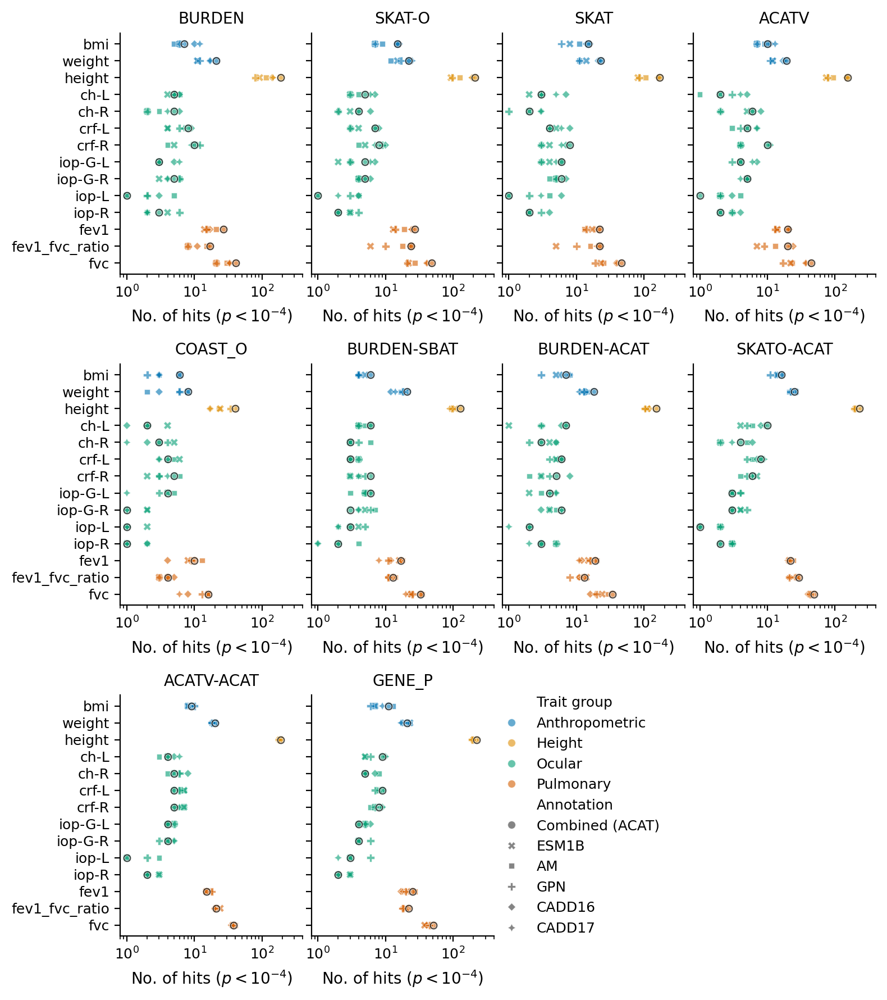

In [14]:
fig, axs = plt.subplots(3, 4, figsize=(4*2, 3*3), dpi=200);

for i, (test, ax) in enumerate(zip(TEST_ORDER, axs.flat)):
    sns.scatterplot(
        data = pd.DataFrame(
            {
                anno: sig_cts.xs(test, level=1)[anno] for anno in sig_cts
            } | {
                'Combined (ACAT)': acat.T.xs(test, level=1).T[0],
                'Trait group': pd.Series(pheno_groups)
            }
        ).reset_index().rename({'index':'Trait'}, axis=1).melt(
            id_vars = ['Trait', 'Trait group'], 
            value_vars = ANNO_ORDER + ['Combined (ACAT)'], 
            var_name = 'Annotation', 
            value_name = 'No. of hits'
        ).sort_values(['Trait group','Annotation']),
        y = 'Trait',
        x = 'No. of hits',
        style = 'Annotation',
        style_order = ['Combined (ACAT)'] + ANNO_ORDER,
        hue='Trait group',
        palette = 'colorblind',
        alpha = 0.6,
        s = 25,
        ax = ax,
        legend = (test == "GENE_P"),
    )

    sns.scatterplot(
        data = pd.DataFrame(
            {
                'ACAT': acat.T.xs(test, level=1).T[0],
                'Trait group': pd.Series(pheno_groups)
            }
        ).reset_index().rename({'index':'Trait'}, axis=1).melt(
            id_vars = ['Trait', 'Trait group'], 
            value_vars = ['ACAT'], 
            var_name = 'Annotation', 
            value_name = 'No. of hits'
        ).sort_values(['Trait group','Annotation']),
        y = 'Trait',
        x = 'No. of hits',
        color = 'k',
        alpha = 0.7,
        marker = r'$\circ$',
        s = 28,
        legend = False,
        ax = ax
    )
    ax.set_title(test, fontsize=10);
    ax.set_xlabel('No. of hits ({0})'.format(r'$p < 10^{-4}$'));
    ax.set_xlim(0.8, 400);
    ax.set_ylabel(''); 
    ax.tick_params(axis='both', labelsize=9)
    
    if test == "GENE_P":
        leg = ax.legend(frameon=0, fontsize=9, bbox_to_anchor=(0.95,0.5), loc='center left')
        leg.set_in_layout(False)
    if i % 4 != 0:
        ax.set_yticklabels(['' for _ in ax.get_yticklabels()]);
        
    ax.semilogx();

axs[2,2].set_visible(0); axs[2,3].set_visible(0);

sns.despine();
fig.tight_layout(w_pad = 0.1, h_pad = 1.0);

fig.savefig('png/supplement/ACAT.png');

/tmp/slurmjob.58068303/ipykernel_2168615/719185822.py:56: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['fev1/fvc' if 'ratio' in t else t for t in map(lambda s: s.get_text(), ax.get_xticklabels())]);


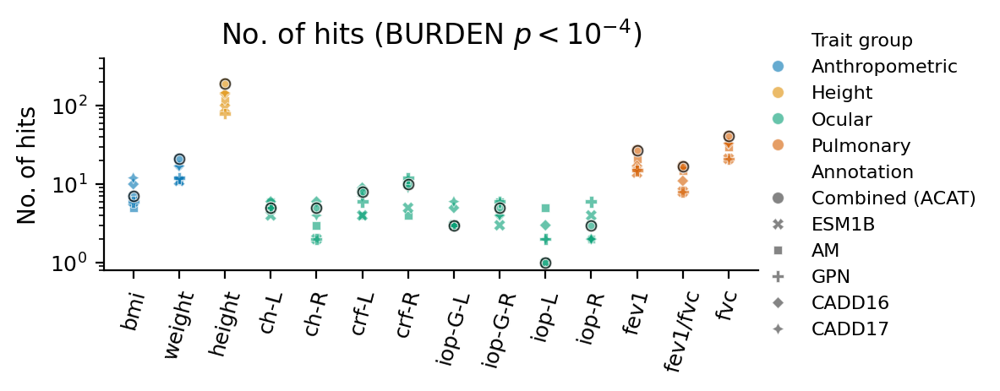

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(6, 2.5), dpi=200);

test='BURDEN'

sns.scatterplot(
    data = pd.DataFrame(
        {
            anno: sig_cts.xs(test, level=1)[anno] for anno in sig_cts
        } | {
            'Combined (ACAT)': acat.T.xs(test, level=1).T[0],
            'Trait group': pd.Series(pheno_groups)
        }
    ).reset_index().rename({'index':'Trait'}, axis=1).melt(
        id_vars = ['Trait', 'Trait group'], 
        value_vars = ANNO_ORDER + ['Combined (ACAT)'], 
        var_name = 'Annotation', 
        value_name = 'No. of hits'
    ).sort_values(['Trait group','Annotation']),
    x = 'Trait',
    y = 'No. of hits',
    style = 'Annotation',
    style_order = ['Combined (ACAT)'] + ANNO_ORDER,
    hue='Trait group',
    palette = 'colorblind',
    alpha = 0.6,
    s = 25,
    ax = ax,
)

sns.scatterplot(
    data = pd.DataFrame(
        {
            'ACAT': acat.T.xs(test, level=1).T[0],
            'Trait group': pd.Series(pheno_groups)
        }
    ).reset_index().rename({'index':'Trait'}, axis=1).melt(
        id_vars = ['Trait', 'Trait group'], 
        value_vars = ['ACAT'], 
        var_name = 'Annotation', 
        value_name = 'No. of hits'
    ).sort_values(['Trait group','Annotation']),
    x = 'Trait',
    y = 'No. of hits',
    color = 'k',
    alpha = 0.7,
    marker = r'$\circ$',
    s = 28,
    legend = False,
    ax = ax
)
ax.set_title('No. of hits ({1} {0})'.format(r'$p < 10^{-4}$', test));
ax.set_ylim(0.8, 400);
ax.set_xlabel(''); 
ax.tick_params(axis='both', labelsize=9)
ax.tick_params(axis='x', rotation=75);
ax.set_xticklabels(['fev1/fvc' if 'ratio' in t else t for t in map(lambda s: s.get_text(), ax.get_xticklabels())]);

leg = ax.legend(frameon=0, fontsize=8, bbox_to_anchor=(0.975, 1.2), loc='upper left')
#leg.set_in_layout(False)
    
ax.semilogy();

sns.despine();
fig.tight_layout();

# Score rank correlation

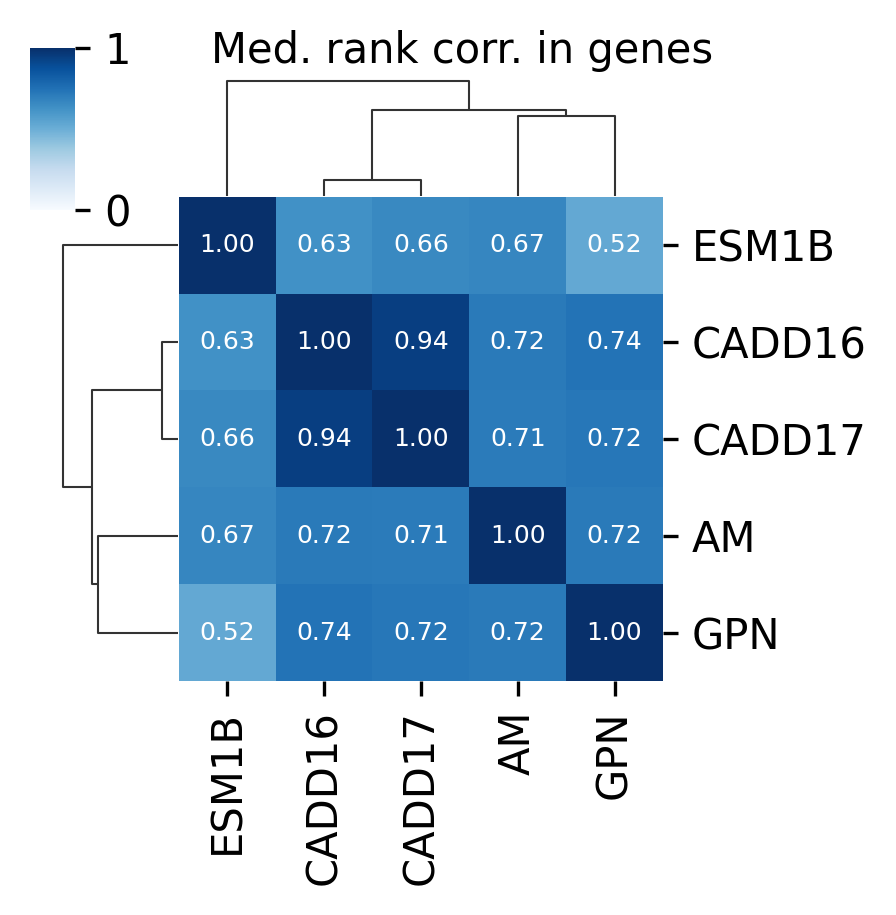

In [16]:
g = sns.clustermap(
    vs.query(
        'mis'
    ).groupby(
        'gene_id'
    )[ANNO_RANKS].corr(
        method='spearman'
    ).groupby(
        level=1
    ).median(
    ).loc[ANNO_RANKS,ANNO_RANKS].rename(
        lambda s: s.split('_')[0].upper(), axis=0,
    ).rename(
        lambda s: s.split('_')[0].upper(), axis=1,
    ),
    cmap = 'Blues',
    vmin = 0, vmax = 1,
    annot=True, fmt=".2f", annot_kws={'size': 6},
    figsize = (3, 3),
);

g.fig.suptitle('Med. rank corr. in genes', y=1.0, fontsize=10);

plt.savefig('png/supplement/in_gene_score_corr.png', dpi=200);

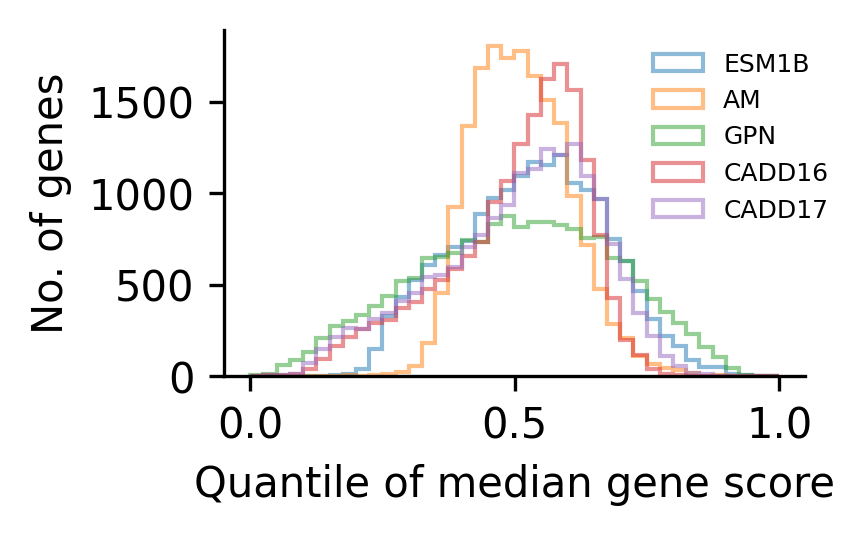

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(2.5, 1.5))

mean_gene_scores.plot.hist(histtype='step', bins=40, alpha=0.5, ax=ax)
plt.xlabel('Quantile of median gene score');
plt.ylabel('No. of genes');

sns.despine();
plt.legend(ANNO_ORDER, fontsize=6, frameon=0, bbox_to_anchor=(0.7, 1.0), loc='upper left');

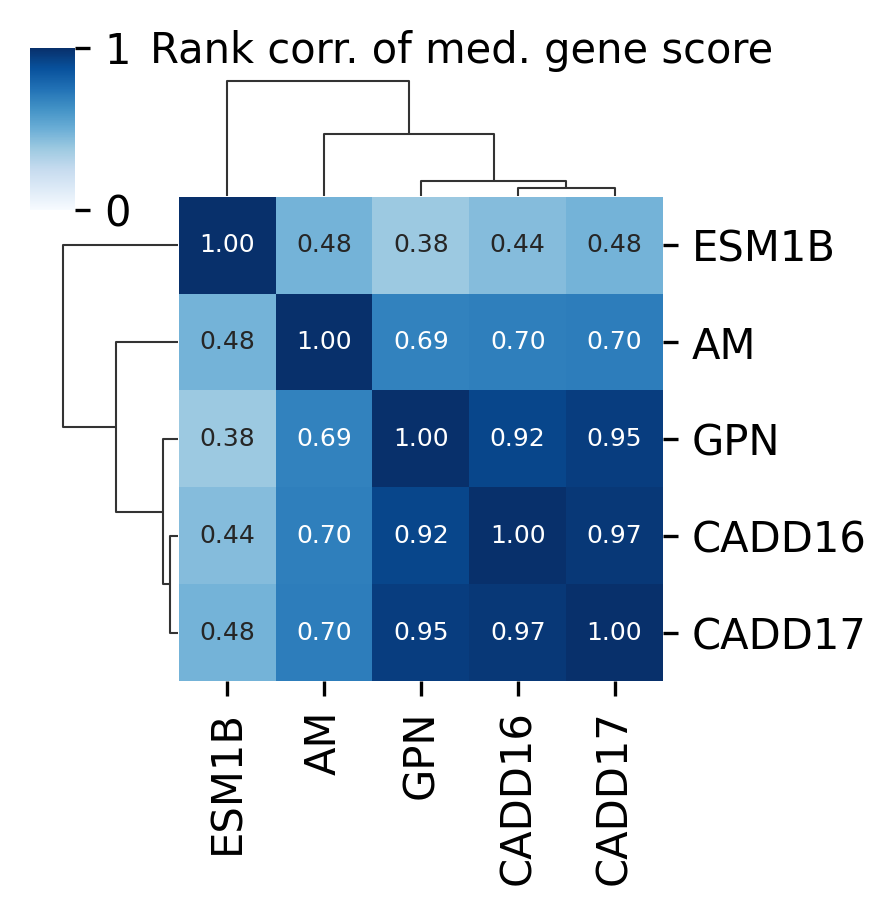

In [18]:
g = sns.clustermap(
    vs.query(
        'mis'
    ).groupby(
        'gene_id'
    )[ANNO_RANKS].mean(
    ).corr(
        method='spearman'
    ).rename(
        lambda s: s.split('_')[0].upper(), axis=0,
    ).rename(
        lambda s: s.split('_')[0].upper(), axis=1,
    ),
    cmap = 'Blues',
    vmin = 0, vmax = 1,
    annot=True, fmt=".2f", annot_kws={'size': 6},
    figsize = (3, 3),
);

g.fig.suptitle('Rank corr. of med. gene score', y=1.0, fontsize=10);

plt.savefig('png/supplement/median_gene_score_corr.png', dpi=200);

# Thresholds

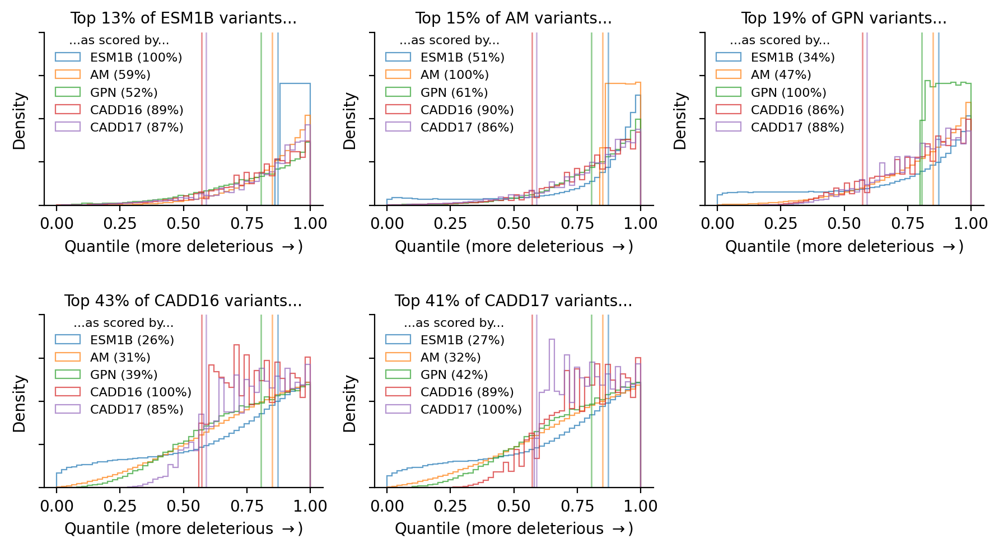

In [19]:
fig, axs = plt.subplots(2, 3, figsize=(9, 5), dpi=200)

for s1, ax in zip(ANNO_RANKS, axs.flat):

    q = 1 - (v_uniq[s1[:-5]] >= ANNO_T[s1[:-5]]).mean()
    for s2 in ANNO_RANKS:  
        vs.loc[(vs[s1] > q), s2].plot.hist(
            bins=np.linspace(0, 1, 51),
            histtype='step',
            alpha = 0.7,
            linewidth = 0.8,
            ax = ax
        );

    ax.legend(
        [
            '{0} ({1:.0f}%)'.format(
                a,
                100 * (vs.loc[(vs[s1] > q), r] > (1 - (v_uniq[r[:-5]] >= ANNO_T[r[:-5]]).mean())).mean() 
            ) for a,r in zip(ANNO_ORDER, ANNO_RANKS)
        ],
        fontsize=8, 
        title='...as scored by...',
        title_fontsize=8,
        loc='upper left',
        bbox_to_anchor=(0, 1.05),
        frameon=0,
    );
    ax.set_title(
        'Top {0}% of {1} variants...'.format(
            round((1-q)*100), 
            s1[:-5]
        ), 
        fontsize=10,
    );
    ax.set_xlabel('Quantile (more deleterious {})'.format(r'$\rightarrow$'));
    ax.set_yticks(np.linspace(0, 180000 + 20000*('CADD' in s1), 5), labels=['' for _ in range(5)]);
    ax.set_ylabel('Density');
    for i,s in enumerate(ANNO_ORDER):
        ax.axvline(
            1 - (v_uniq[s] >= ANNO_T[s]).mean(),
            alpha = 0.5,
            linewidth = 1.0,
            color = plt.get_cmap('tab10')(i)
        )

axs[-1,-1].set_visible(0);
fig.tight_layout(h_pad=2.5);
sns.despine();

fig.savefig('png/supplement/quantile_intersections.png');

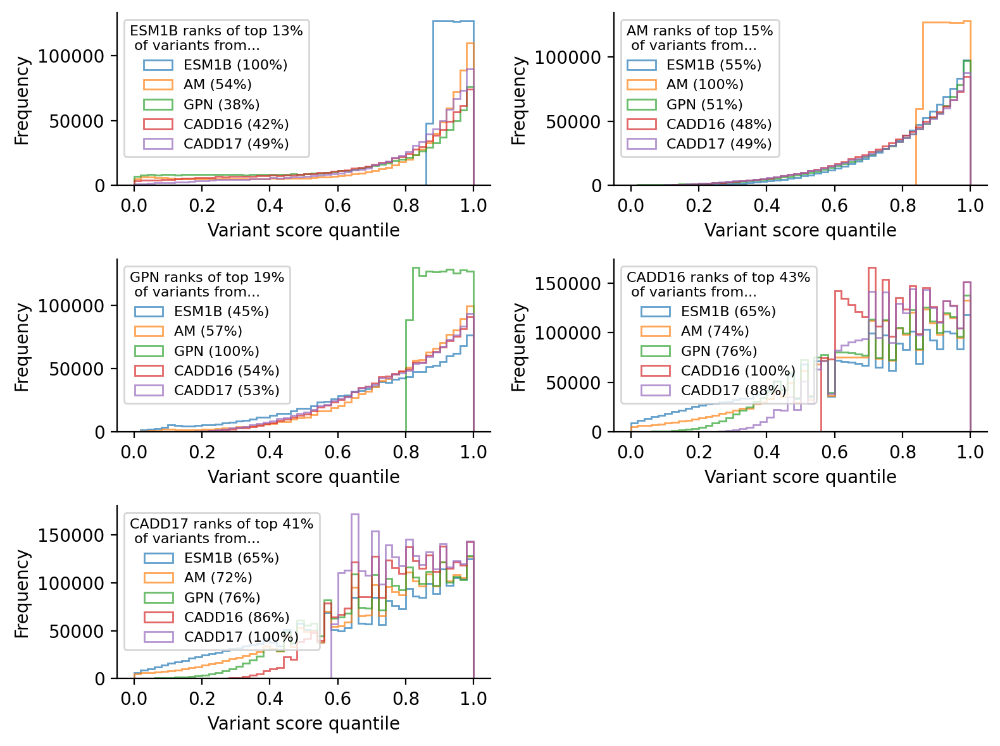

In [20]:
fig, axs = plt.subplots(3, 2, figsize=(8, 6), dpi=200)

for s1, ax in zip(ANNO_RANKS, axs.flat):
    q = 1 - (v_uniq[s1[:-5]] >= ANNO_T[s1[:-5]]).mean()
    for s2 in ANNO_RANKS:  
        vs.loc[(vs[s2] > q), s1].plot.hist(
            bins=np.linspace(0, 1, 51),
            histtype='step',
            alpha = 0.7,
            ax = ax
        );

    ax.legend(
        [
            '{0} ({1:.0f}%)'.format(
                a,
                100 * (vs.loc[(vs[r] > q), s1] > q).mean() 
            ) for a,r in zip(ANNO_ORDER, ANNO_RANKS)
        ],
        title='{1} ranks of top {0}%\n of variants from...'.format(
            round((1-q)*100), 
            s1[:-5]
        ), 
        fontsize=8, 
        title_fontsize=8
    );
    ax.set_xlabel('Variant score quantile');

axs[2,1].set_visible(0);
fig.tight_layout();
sns.despine();

# UpSet

In [21]:
sig4 = sumstats.query('LOG10P > 4 & pop_sample=="unrelated" & (mask == "del" | mask == "bdm")')
sig4[['test_keys','pheno','gene_id','anno']].value_counts()

test_keys   pheno   gene_id          anno  
ACATV       bmi     ENSG00000104960  AM        1
                    ENSG00000109436  AM        1
                    ENSG00000113140  CADD16    1
                                     CADD17    1
                    ENSG00000114098  ESM1B     1
                                              ..
SKATO-ACAT  weight  ENSG00000274070  AM        1
                                     CADD16    1
                                     CADD17    1
                                     ESM1B     1
                                     GPN       1
Name: count, Length: 12357, dtype: int64

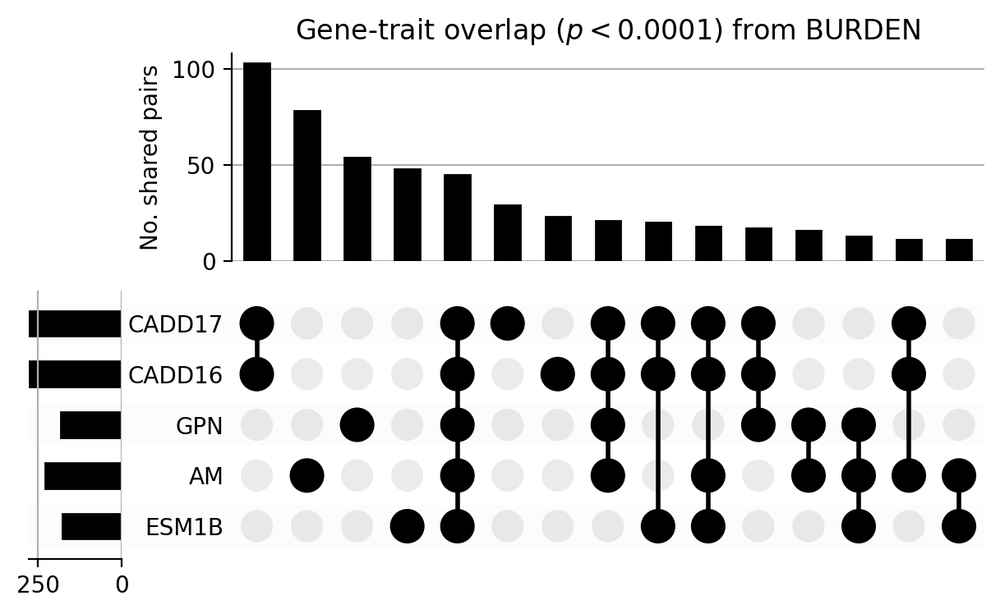

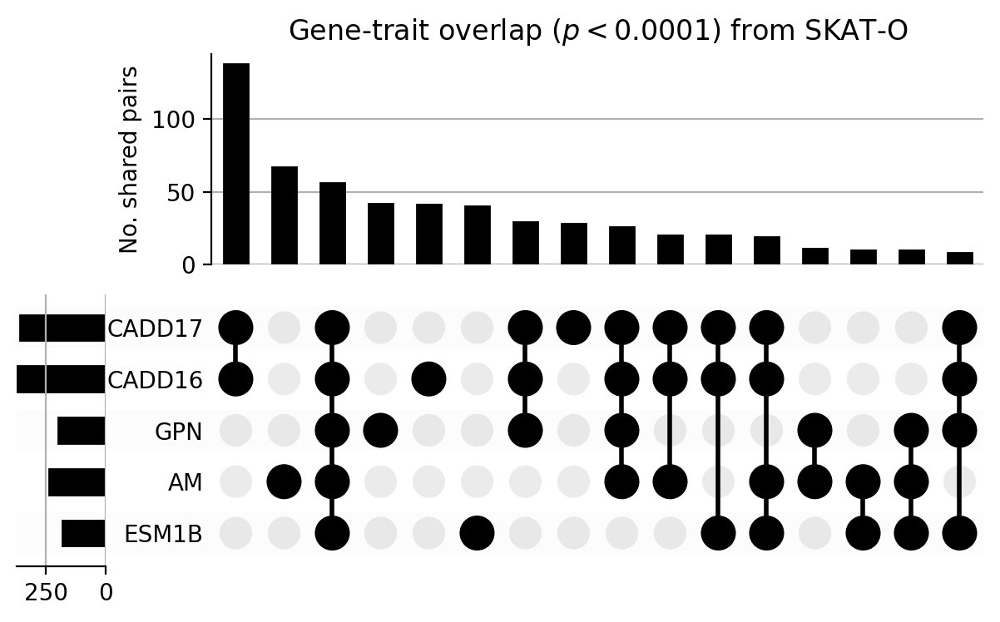

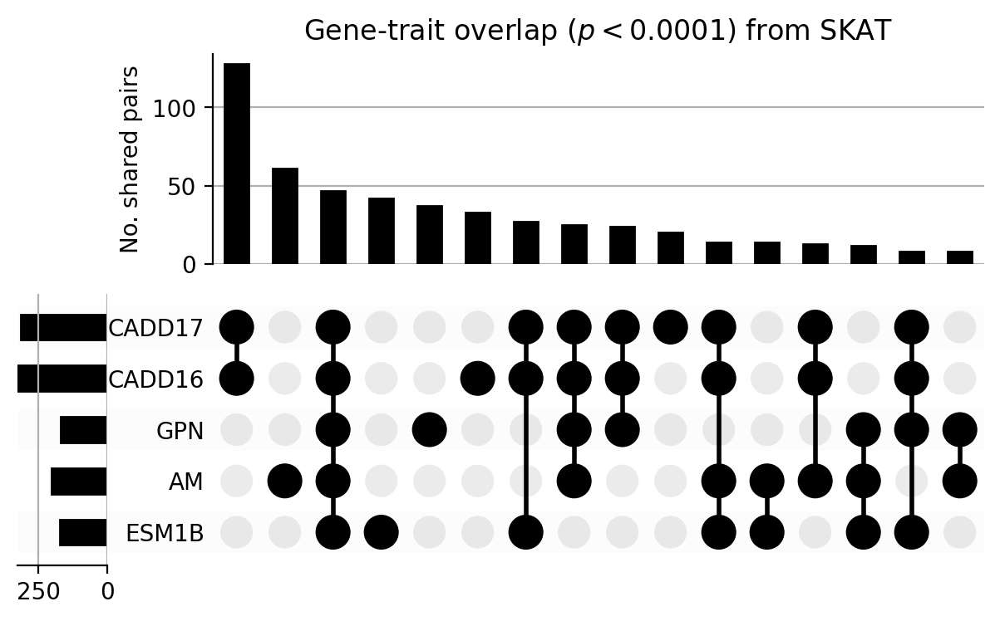

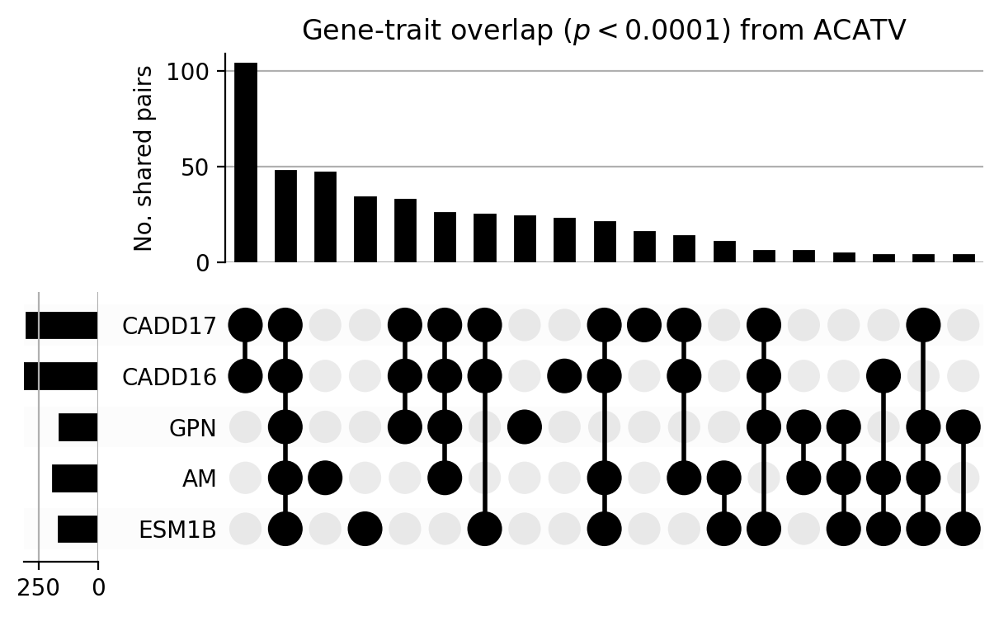

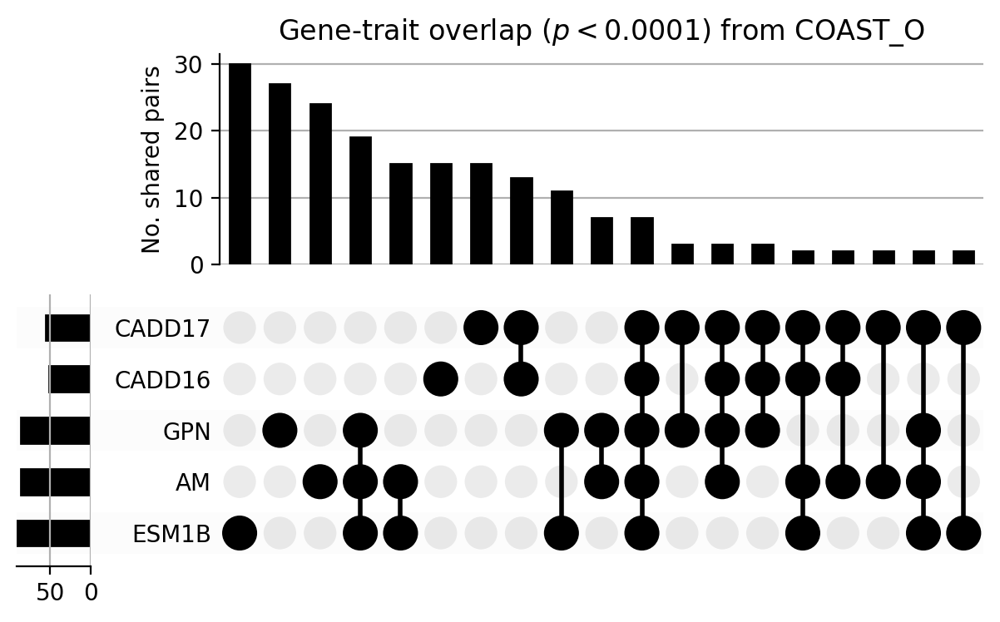

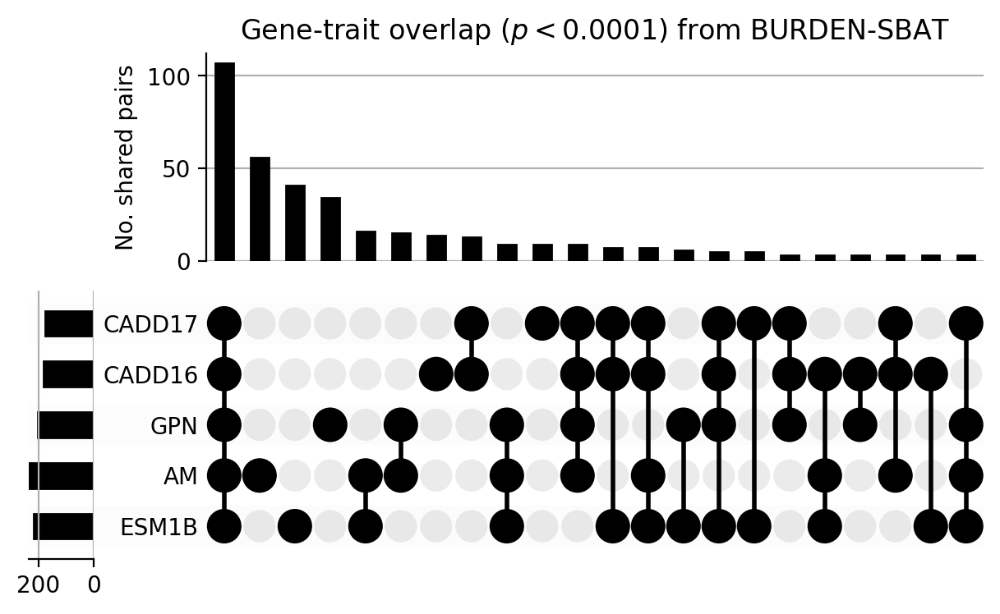

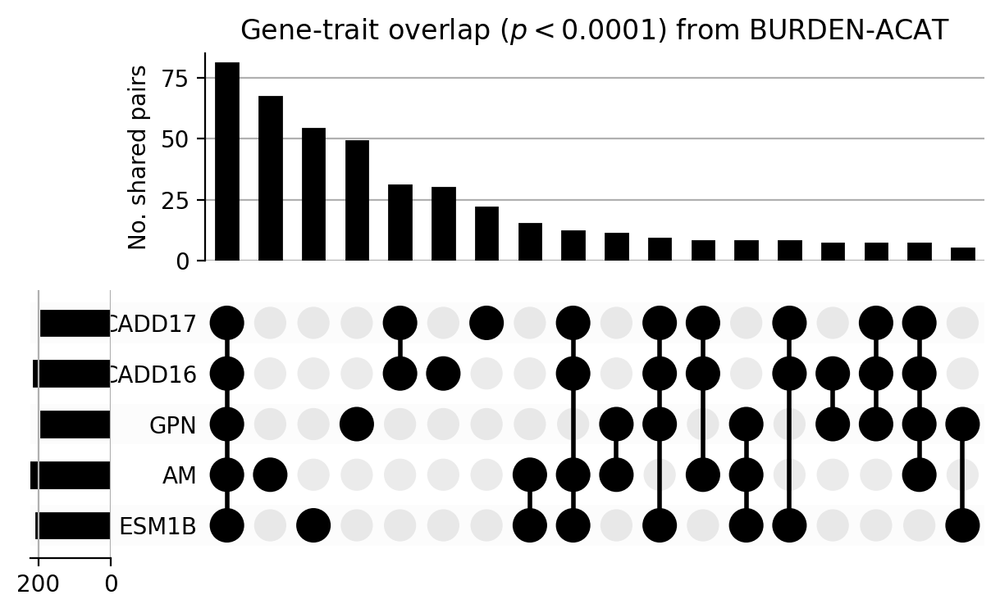

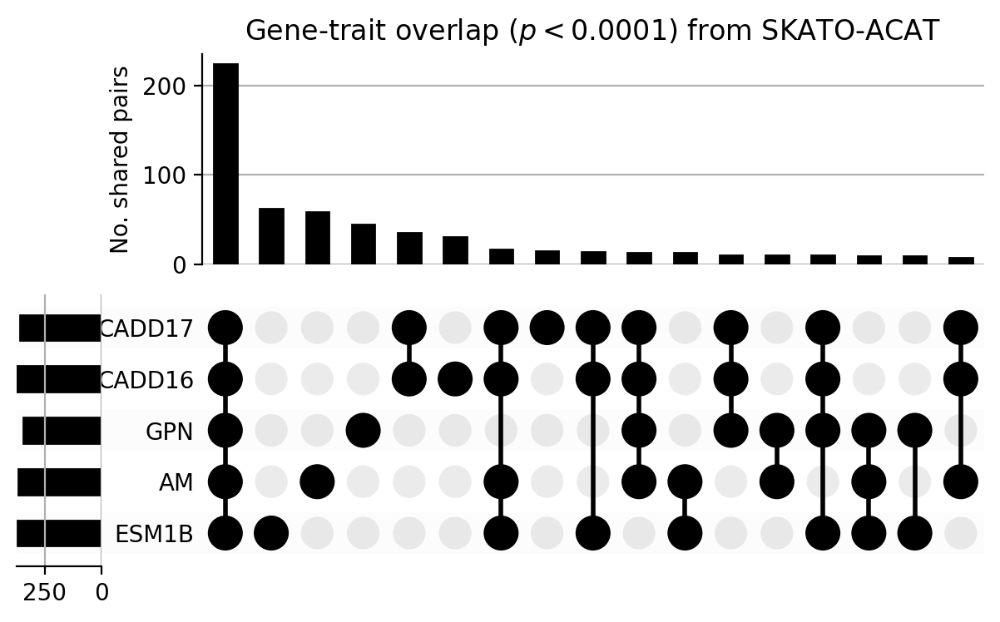

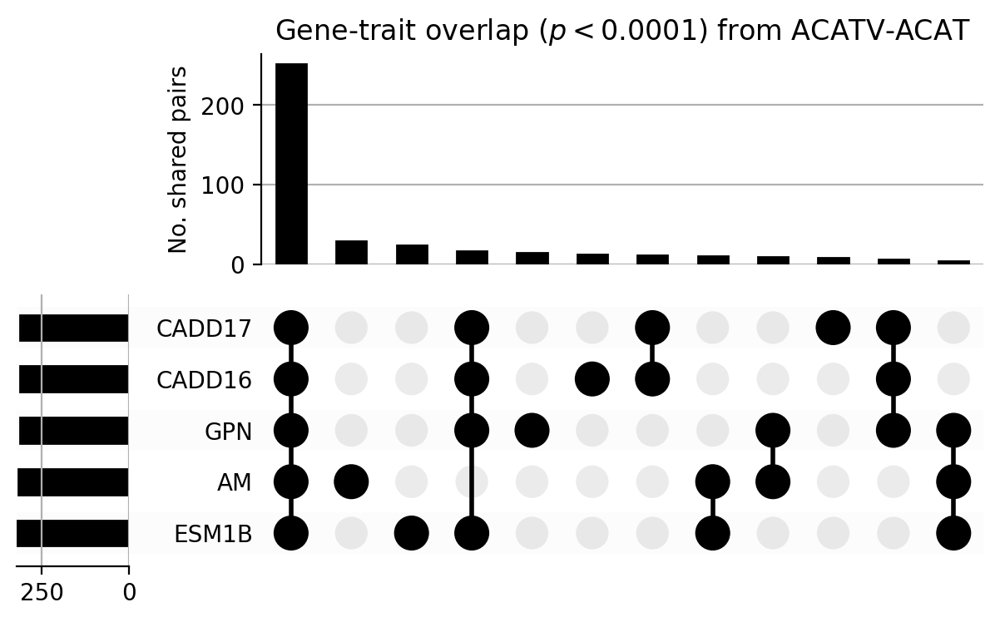

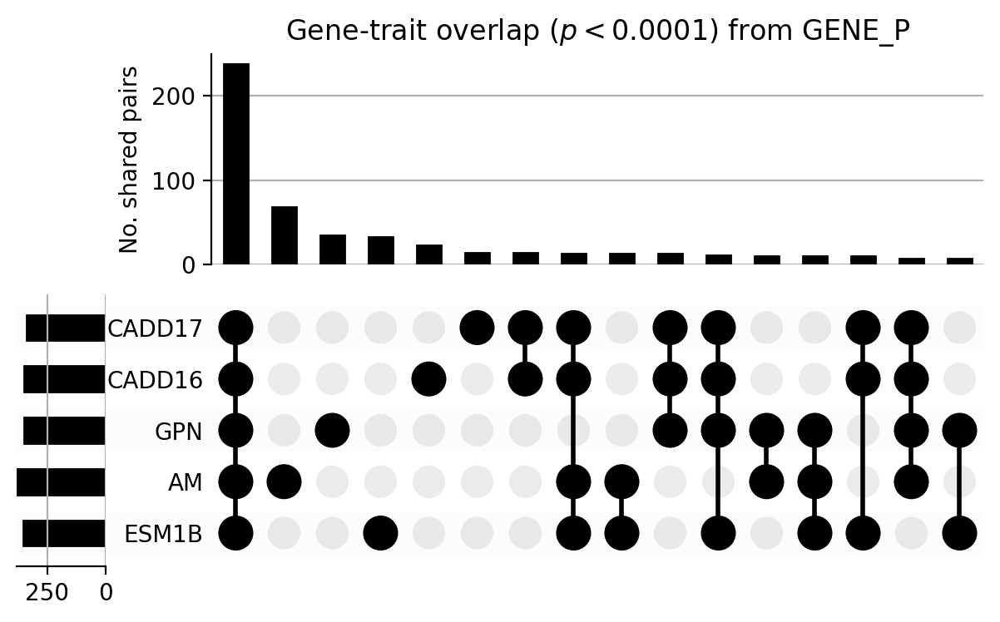

In [22]:
for t in TEST_ORDER:
    fig = plt.figure(figsize=(7.5, 4), dpi=200);

    cts = sig4.query('test_keys == @t').groupby(
        ['pheno','gene_id']
    )['anno'].apply(
        lambda x: tuple([(a in x.values) for a in ANNO_ORDER])
    ).value_counts(
    ).to_frame(
    )

    cts.index = pd.MultiIndex.from_tuples(cts.index, names=ANNO_ORDER)
    
    upset = us.UpSet(
        cts['count'],
        #cts[['count','group']],
        sort_by='cardinality',
        sort_categories_by='input',
        min_degree = 1,
        min_subset_size = int(0.01 * cts['count'].sum()),
        other_dots_color = 0.08,
        shading_color = 0.01,
        show_percentages = False,
        intersection_plot_elements = 4,
        element_size = None,
    )
    
    ax_dict = upset.plot(fig = fig);
    ax_dict['intersections'].set_title(
        'Gene-trait overlap ({0}) from {1}'.format(r'$p<{}$'.format(p_star), t)
    );   
    ax_dict['intersections'].set_ylabel('No. shared pairs');

    fig.savefig('png/supplement/{}_anno_intersect.png'.format(t));

# More supplemental plots

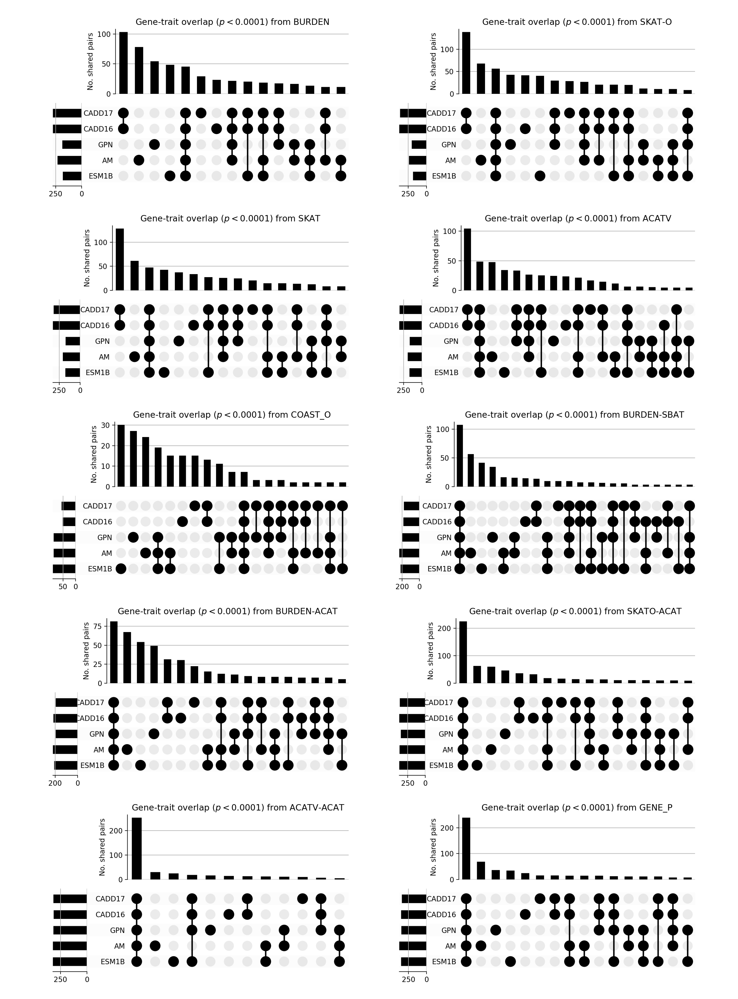

In [23]:
import matplotlib.image as mpimg

fig, axs = plt.subplots(5, 2, figsize=(16,20), dpi=200)

# Display result
for test, ax in zip(TEST_ORDER, axs.flat):
    ax.imshow(mpimg.imread('png/supplement/{}_anno_intersect.png'.format(test)))
    ax.axis('off')

fig.tight_layout(w_pad = -9, h_pad = -1)
plt.savefig('png/supplement/ALL_anno_intersect.png')

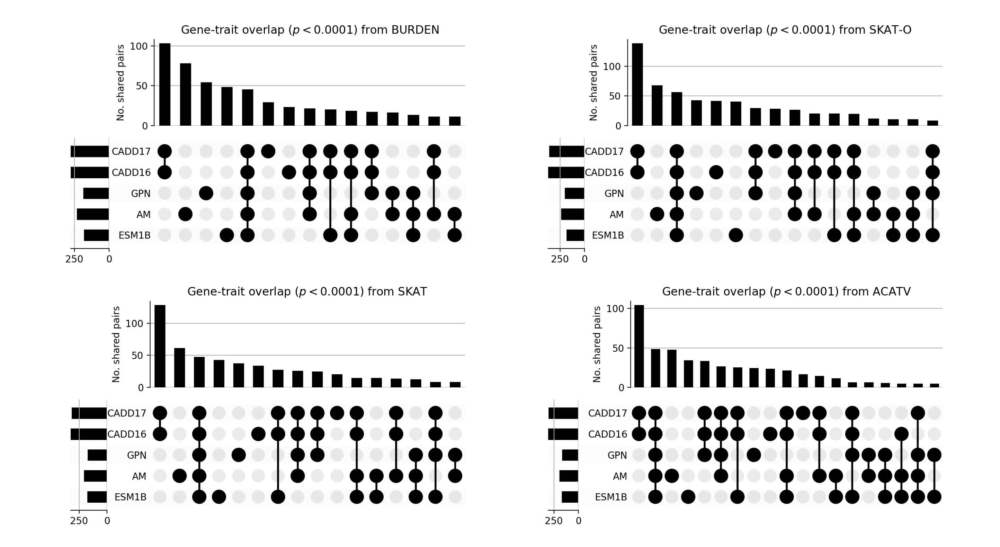

In [24]:
fig, axs = plt.subplots(2, 2, figsize=(16,8), dpi=200)

# Display result
for test, ax in zip(TEST_ORDER1, axs.flat):
    ax.imshow(mpimg.imread('png/supplement/{}_anno_intersect.png'.format(test)))
    ax.axis('off')

fig.tight_layout(w_pad = -11, h_pad = -1)
plt.savefig('png/supplement/primary_anno_intersect.png')

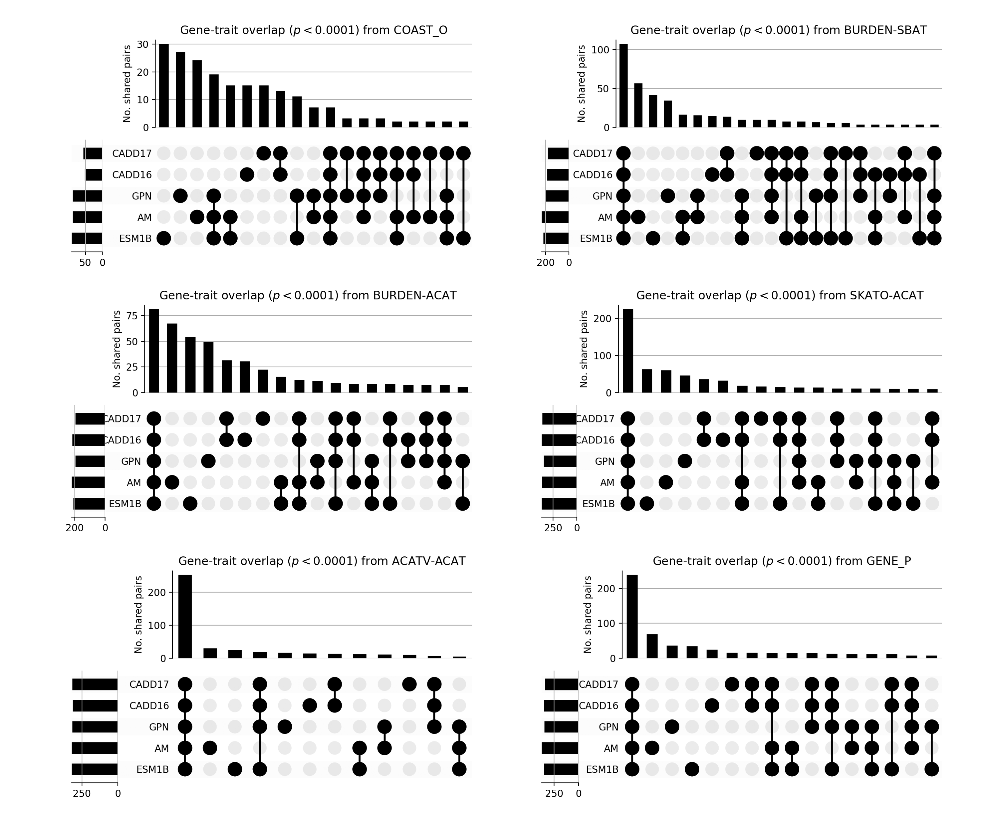

In [25]:
fig, axs = plt.subplots(3, 2, figsize=(16,12), dpi=200)

# Display result
for test, ax in zip(TEST_ORDER2, axs.flat):
    ax.imshow(mpimg.imread('png/supplement/{}_anno_intersect.png'.format(test)))
    ax.axis('off')

fig.tight_layout(w_pad = -11, h_pad = -1)
plt.savefig('png/supplement/secondary_anno_intersect.png')

In [26]:
{r:(1 - (v_uniq[r[:-5]] >= ANNO_T[r[:-5]]).mean()) for r in ANNO_RANKS}

{'ESM1B_RANK': np.float64(0.872451098441965),
 'AM_RANK': np.float64(0.8505487791227097),
 'GPN_RANK': np.float64(0.8057535176590195),
 'CADD16_RANK': np.float64(0.5724982622860314),
 'CADD17_RANK': np.float64(0.58837082928563)}

In [27]:
mean_gene_scores

,ESM1B_RANK,AM_RANK,GPN_RANK,CADD16_RANK,CADD17_RANK
gene_name,,,,,
A1BG,0.478822,0.440842,0.162623,0.307384,0.279762
A1CF,0.705286,0.603500,0.664499,0.634150,0.642791
A2M,0.407047,0.420329,0.366711,0.440783,0.358194
A2ML1,0.399892,0.405665,0.322800,0.383028,0.340164
A3GALT2,0.600739,0.448004,0.390790,0.509817,0.459838
...,...,...,...,...,...
ZYG11A,0.471431,0.417033,0.404772,0.450734,0.420248
ZYG11B,0.521241,0.603018,0.744247,0.555406,0.595195
ZYX,0.565387,0.486871,0.474219,0.519839,0.534374


In [28]:
s_het

,ensg,hgnc,chrom,obs_lof,exp_lof,prior_mean,post_mean,post_lower_95,post_upper_95
0,ENSG00000198488,HGNC:24141,chr11,12.0,8.9777,0.001997,0.000065,0.000007,0.000178
1,ENSG00000164363,HGNC:26441,chr5,31.0,28.5500,0.000973,0.000161,0.000026,0.000442
2,ENSG00000159337,HGNC:30038,chr15,28.0,41.8400,0.000856,0.000170,0.000019,0.000533
3,ENSG00000177558,HGNC:26366,chr19,12.0,9.9101,0.001040,0.000175,0.000025,0.000487
4,ENSG00000062524,HGNC:6721,chr15,40.0,42.6820,0.002000,0.000180,0.000012,0.000589
...,...,...,...,...,...,...,...,...,...
19066,ENSG00000108298,HGNC:10312,chr17,0.0,12.2410,0.349655,0.777394,0.188250,0.999947
19067,ENSG00000142937,HGNC:10441,chr1,0.0,13.8460,0.367146,0.781929,0.176357,0.999976
19068,ENSG00000231500,HGNC:10401,chr6,0.0,11.4500,0.407376,0.823303,0.190498,0.999999
19069,ENSG00000108055,HGNC:2468,chr10,0.0,79.4900,0.376332,0.841343,0.460300,0.998543


In [29]:
df = sig4.query('test_keys == "BURDEN"').groupby(
    ['pheno','GENE','gene_id']
)['anno'].apply(
    lambda x: tuple([(a in x.values) for a in ANNO_ORDER])
).apply(pd.Series).rename(
    {i:a for i,a in enumerate(ANNO_ORDER)}, 
    axis=1
).reset_index()

for rs in mean_gene_scores.columns:
    df[rs] = df['GENE'].apply(mean_gene_scores[rs].rank().get)

df['s_het'] = df['gene_id'].apply(s_het.set_index('ensg')['post_mean'].get)

df.head()

,pheno,GENE,gene_id,ESM1B,AM,GPN,CADD16,CADD17,ESM1B_RANK,AM_RANK,GPN_RANK,CADD16_RANK,CADD17_RANK,s_het
0,bmi,ABCC10,ENSG00000124574,False,True,False,False,False,7690.0,4976.0,9106.0,10697.0,10728.0,0.001138
1,bmi,ANKRD27,ENSG00000105186,False,False,False,False,True,3498.0,5402.0,7967.0,8704.0,8086.0,0.000861
2,bmi,ARMC8,ENSG00000114098,True,False,False,False,False,7964.0,14176.0,16814.0,14117.0,15173.0,0.141052
3,bmi,CALCR,ENSG00000004948,False,False,False,True,True,11930.0,12255.0,5729.0,6242.0,6235.0,0.002339
4,bmi,CAMKV,ENSG00000164076,False,False,True,False,False,15347.0,8504.0,11999.0,8625.0,13594.0,0.117975


In [30]:
sumstats.columns

Index(['CHROM', 'GENPOS', 'GENE', 'gene_id', 'A1FREQ', 'N', 'TEST', 'BETA',
       'SE', 'CHISQ', 'LOG10P', 'pheno', 'anno', 'mask', 'test_keys',
       'pop_sample', 'pheno_group', 's_het', '1/s_het', 's_het_high',
       's_het_low', 'loeuf', '1/loeuf', 'loeuf_high', 'loeuf_low'],
      dtype='object')

In [31]:
mafs = sumstats.query('test_keys == "BURDEN" & pheno == "height" & pop_sample == "unrelated"').groupby(
    'gene_id'
).filter(
    lambda x: len(x) == 15
).pivot(
    index = 'gene_id',
    columns = ['anno','mask'],
    values = 'A1FREQ'
)

mafs.describe()

anno         CADD16                                        AM                \
mask            del           mod           ben           del           mod   
count  14391.000000  14391.000000  14391.000000  14391.000000  14391.000000   
mean       0.005272      0.003241      0.006553      0.001165      0.000819   
std        0.006735      0.004276      0.009064      0.002148      0.001810   
min        0.000019      0.000010      0.000009      0.000009      0.000009   
25%        0.001315      0.000673      0.001153      0.000230      0.000113   
50%        0.002970      0.001578      0.003569      0.000485      0.000260   
75%        0.007059      0.004218      0.008906      0.001127      0.000649   
max        0.261056      0.128941      0.230364      0.100557      0.076029   

anno                        ESM1B                                       GPN  \
mask            ben           del           mod           ben           del   
count  14391.000000  14391.000000  14391.000000  14391.000000  14391.000000   
mean       0.012780      0.001384      0.006559      0.007087      0.001572   
std        0.014052      0.002436      0.008913      0.008582      0.002770   
min        0.000044      0.000009      0.000009      0.000019      0.000009   
25%        0.004050      0.000187      0.001402      0.001704      0.000235   
50%        0.009078      0.000518      0.003630      0.004366      0.000630   
75%        0.016549      0.001374      0.008613      0.009698      0.001659   
max        0.316274      0.077381      0.253769      0.218375      0.122343   

anno                                     CADD17                              
mask            mod           ben           del           mod           ben  
count  14391.000000  14391.000000  14391.000000  14391.000000  14391.000000  
mean       0.007241      0.006199      0.005141      0.003449      0.006478  
std        0.008516      0.008834      0.006501      0.004708      0.008918  
min        0.000026      0.000010      0.000017      0.000009      0.000010  
25%        0.001884      0.001068      0.001259      0.000685      0.001214  
50%        0.004620      0.003279      0.002890      0.001655      0.003553  
75%        0.009719      0.008465      0.006861      0.004482      0.008804  
max        0.284860      0.248411      0.229027      0.156882      0.248125

In [32]:
mafs['s_het'] = [s_het.set_index('ensg')['post_mean'].get(g) for g in mafs.index]
mafs['s_het_rank'] = 100 * mafs['s_het'].rank() / mafs.shape[0]
mafs[['s_het','s_het_rank']].describe()

anno,s_het,s_het_rank
mask,,
count,14215.000000,14215.000000
mean,0.048999,49.391981
std,0.087729,28.515471
min,0.000065,0.006949
25%,0.002378,24.699465
50%,0.011452,49.391981
75%,0.056531,74.084497
max,0.880224,98.777013


In [33]:
pd.concat([mafs.xs('del',level=1,axis=1)[ANNO_ORDER], mafs['s_het']], axis=1).corr(method='spearman')

,ESM1B,AM,GPN,CADD16,CADD17,s_het
ESM1B,1.000000,0.504969,0.320094,0.437943,0.440711,-0.295369
AM,0.504969,1.000000,0.614088,0.635252,0.636762,-0.126508
GPN,0.320094,0.614088,1.000000,0.587248,0.616341,0.276928
CADD16,0.437943,0.635252,0.587248,1.000000,0.955360,-0.081960
CADD17,0.440711,0.636762,0.616341,0.955360,1.000000,-0.046179
s_het,-0.295369,-0.126508,0.276928,-0.081960,-0.046179,1.000000


In [34]:
pd.concat([mafs.xs('mod',level=1,axis=1)[ANNO_ORDER], mafs['s_het']], axis=1).corr(method='spearman')

,ESM1B,AM,GPN,CADD16,CADD17,s_het
ESM1B,1.000000,0.561860,0.773428,0.636290,0.671215,-0.135067
AM,0.561860,1.000000,0.540233,0.400568,0.418402,-0.137753
GPN,0.773428,0.540233,1.000000,0.690794,0.691929,-0.045780
CADD16,0.636290,0.400568,0.690794,1.000000,0.846510,0.051817
CADD17,0.671215,0.418402,0.691929,0.846510,1.000000,-0.012433
s_het,-0.135067,-0.137753,-0.045780,0.051817,-0.012433,1.000000


In [35]:
pd.concat([mafs.xs('ben',level=1,axis=1)[ANNO_ORDER], mafs['s_het']], axis=1).corr(method='spearman')

,ESM1B,AM,GPN,CADD16,CADD17,s_het
ESM1B,1.000000,0.872149,0.793072,0.857042,0.869178,0.081104
AM,0.872149,1.000000,0.828665,0.850896,0.852881,-0.036052
GPN,0.793072,0.828665,1.000000,0.889128,0.878121,-0.139149
CADD16,0.857042,0.850896,0.889128,1.000000,0.958683,-0.088390
CADD17,0.869178,0.852881,0.878121,0.958683,1.000000,-0.084415
s_het,0.081104,-0.036052,-0.139149,-0.088390,-0.084415,1.000000


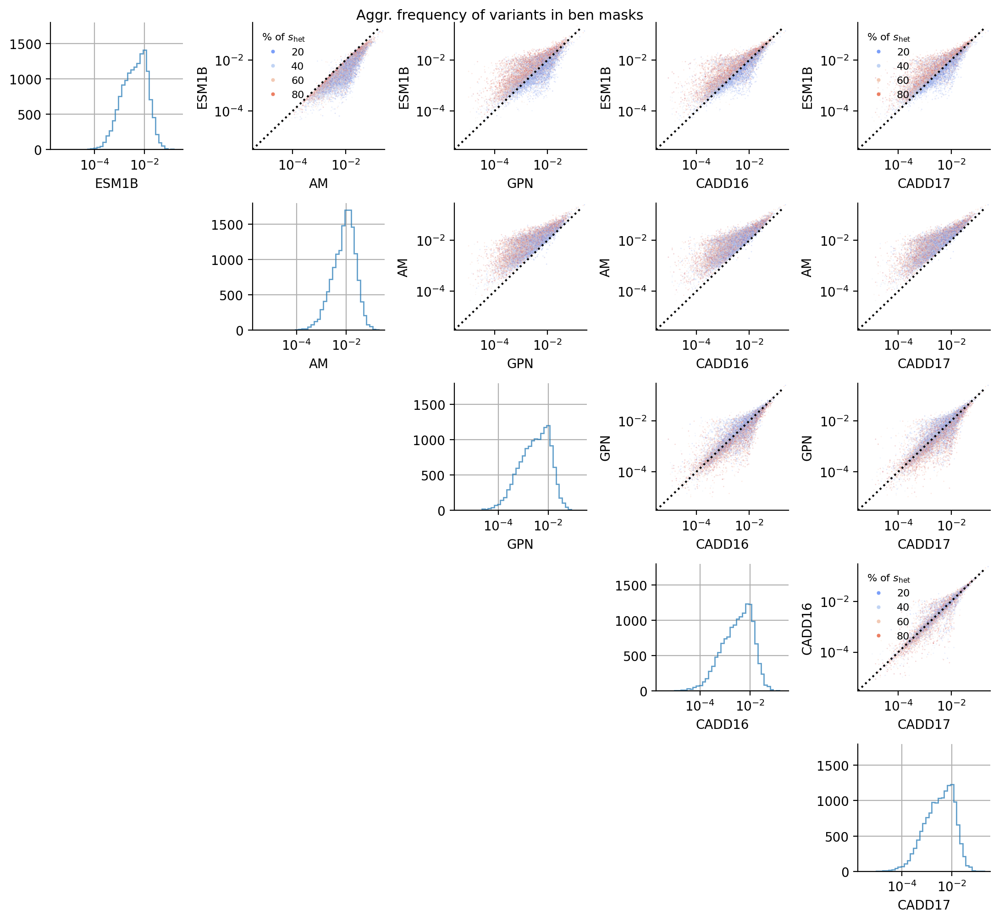

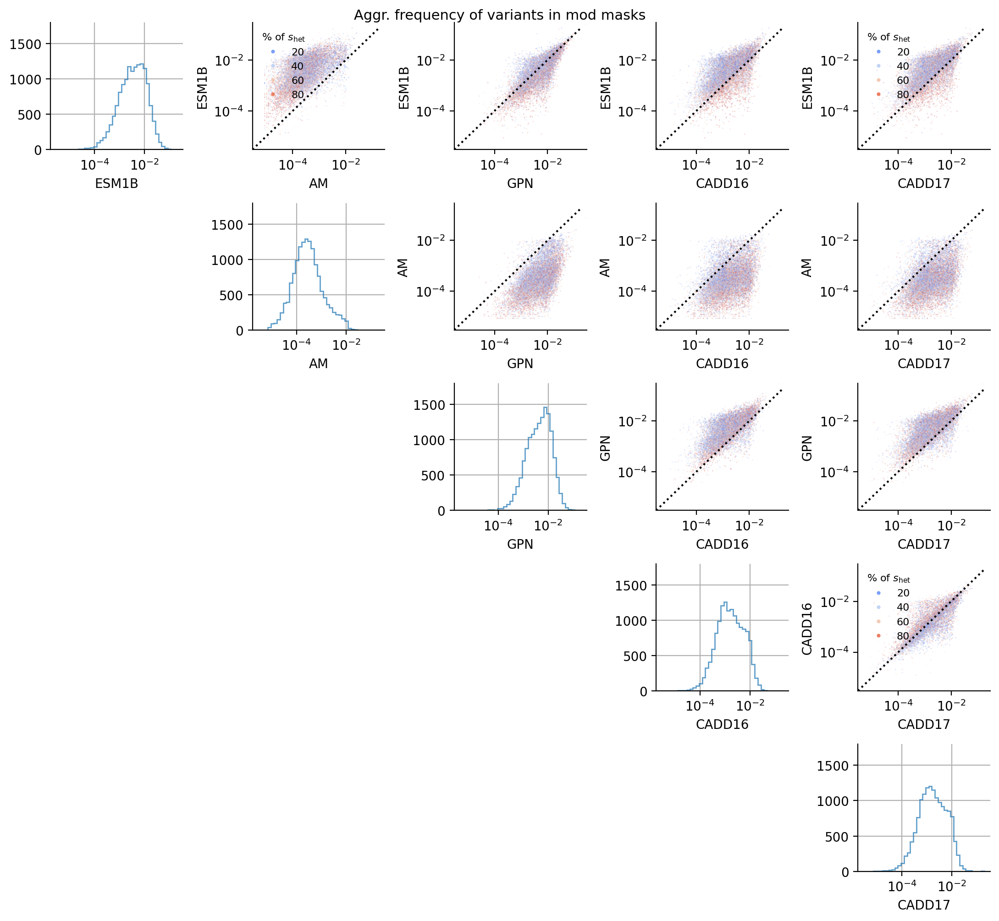

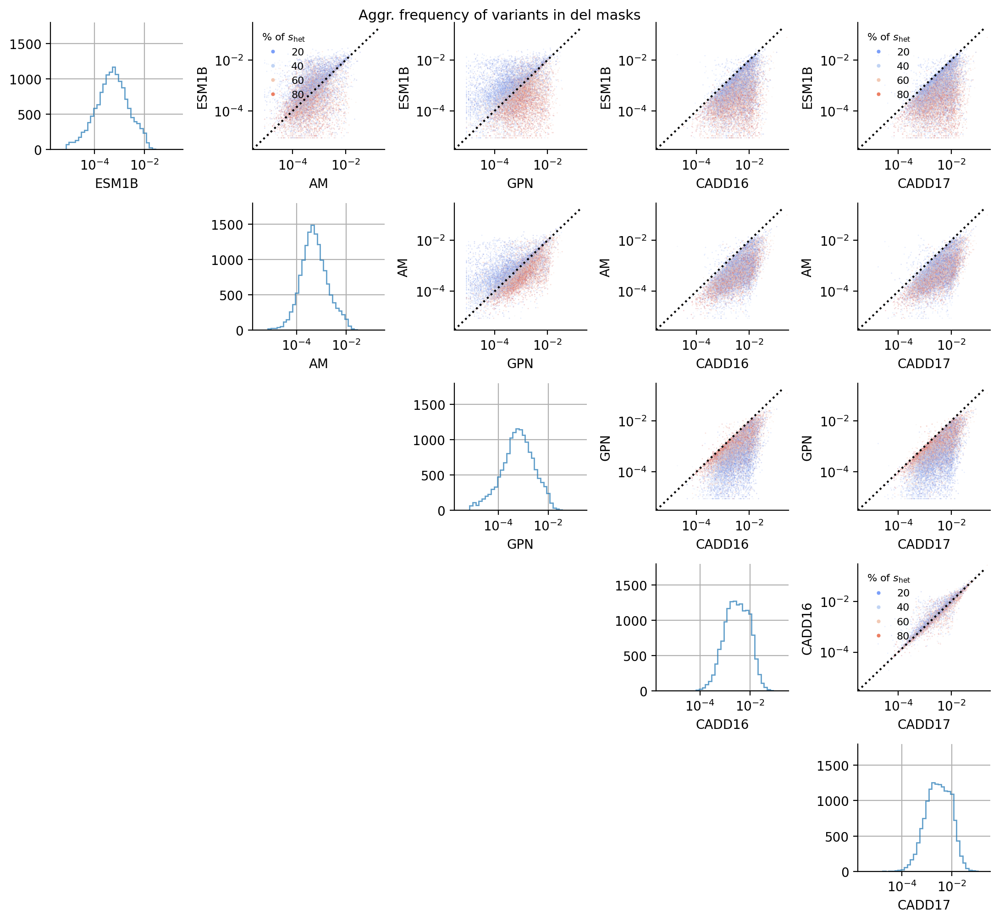

In [36]:
for lab in ['ben','mod','del']:
    
    fig, axs = plt.subplots(5, 5, figsize=(11, 10), dpi=200)
    
    for i in range(axs.shape[0]):
        for j in range(axs.shape[0]):
            ax = axs[i,j]
            if j < i:
                ax.set_visible(0)
            elif j == i:
                mafs[(ANNO_ORDER[i], lab)].hist(
                    ax = ax,
                    bins = np.geomspace(3e-6, 2e-1, 40),
                    alpha = 0.7,
                    histtype = 'step',
                    #orientation = 'horizontal'
                );
                ax.set_ylim(0, 1800);
                ax.set_xlabel(ANNO_ORDER[i]);
                ax.semilogx()
            else:
                sns.scatterplot(
                    data = mafs,
                    y = (ANNO_ORDER[i], lab),
                    x = (ANNO_ORDER[j], lab),
                    hue = 's_het_rank',
                    palette = 'coolwarm',
                    s = 1.,
                    alpha = 0.2,
                    legend = 'brief' if (i in [0,3] and j in [1,4]) else None,
                    ax = ax,
                );
                if (i in [0,3] and j in [1,4]):
                    ax.legend(
                        loc='upper left',
                        bbox_to_anchor=(0,1),
                        frameon=0,
                        title='% of {}'.format(r'$s_\text{het}$'), 
                        title_fontsize=8, 
                        fontsize=8
                    );
                    leg = ax.get_legend()
                    for lh in leg.legend_handles:
                        lh.set_alpha(1.0)
                        lh.set_ms(3)
                ax.plot([3e-6, 2e-1], [3e-6, 2e-1], 'k:');
                ax.set_xlim(3e-6, 3e-1);
                ax.set_ylim(3e-6, 3e-1);
                ax.set_xlabel(ANNO_ORDER[j]);
                ax.set_ylabel(ANNO_ORDER[i]);
                ax.loglog()
    
    sns.despine();
    fig.tight_layout(h_pad=1, w_pad=1);
    fig.suptitle('Aggr. frequency of variants in {} masks'.format(lab), fontsize=11, y=1.0);
    plt.show()

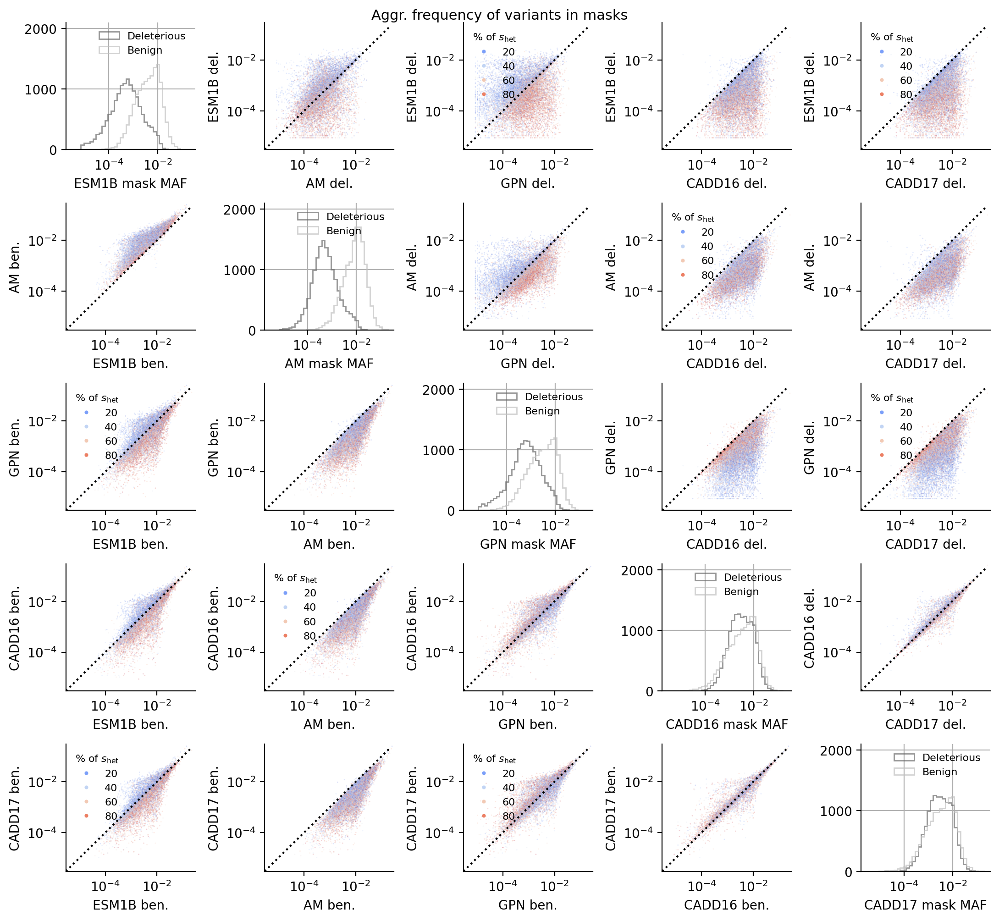

In [37]:
fig, axs = plt.subplots(5, 5, figsize=(11, 10), dpi=200)

for i in range(axs.shape[0]):
    for j in range(axs.shape[0]):
        ax = axs[i,j]
        if j == i:
            for lab, color in [('ben','silver'),('del','dimgrey')][::-1]:
                mafs[(ANNO_ORDER[i], lab)].hist(
                    ax = ax,
                    bins = np.geomspace(3e-6, 2e-1, 40),
                    alpha = 0.7,
                    histtype = 'step',
                    label = {'ben':'Benign', 'del':'Deleterious'}[lab],
                    color = color,
                    #orientation = 'horizontal'
                );
            ax.set_ylim(0, 2100);
            ax.set_xlabel(ANNO_ORDER[i] + ' mask MAF');
            ax.semilogx();
            ax.legend(fontsize=8, frameon=0);
        else:
            lab = 'ben' if j < i else 'del'
            sns.scatterplot(
                data = mafs,
                x = (ANNO_ORDER[j], lab),
                y = (ANNO_ORDER[i], lab),
                hue = 's_het_rank',
                palette = 'coolwarm',
                s = 1.,
                alpha = 0.2,
                legend = 'brief' if (i + j in [2,4,6]) else None,
                ax = ax,
            );
            if (i + j in [2,4,6]):
                ax.legend(
                    loc='upper left',
                    bbox_to_anchor=(0,1),
                    frameon=0,
                    title='% of {}'.format(r'$s_\text{het}$'), 
                    title_fontsize=8, 
                    fontsize=8
                );
                leg = ax.get_legend()
                for lh in leg.legend_handles:
                    lh.set_alpha(1.0)
                    lh.set_ms(3)
            ax.plot([3e-6, 2e-1], [3e-6, 2e-1], 'k:');
            ax.set_xlim(3e-6, 3e-1);
            ax.set_ylim(3e-6, 3e-1);
            ax.set_xlabel('{0} {1}.'.format(ANNO_ORDER[j], lab));
            ax.set_ylabel('{0} {1}.'.format(ANNO_ORDER[i], lab));
            ax.loglog()

sns.despine();
fig.tight_layout(h_pad=1, w_pad=1);
fig.suptitle('Aggr. frequency of variants in masks'.format(lab), fontsize=11, y=1.0);
plt.show()

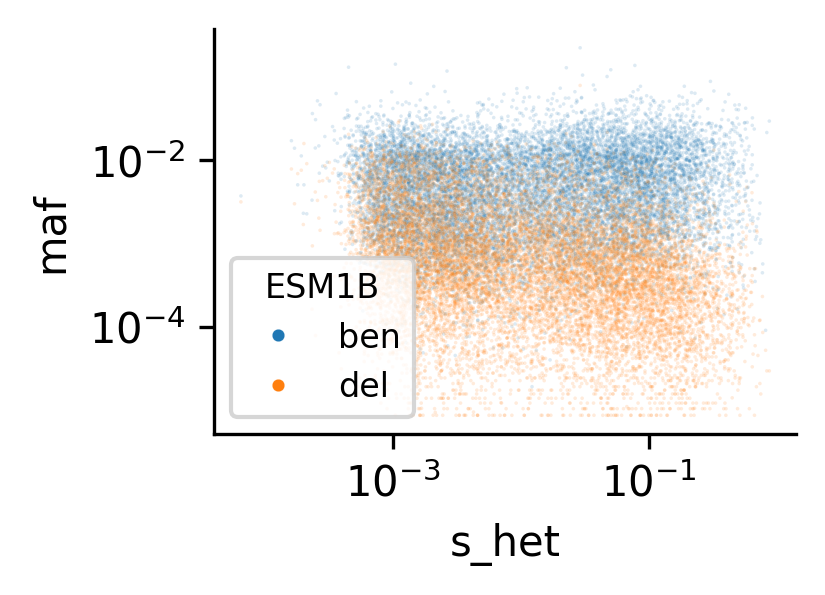

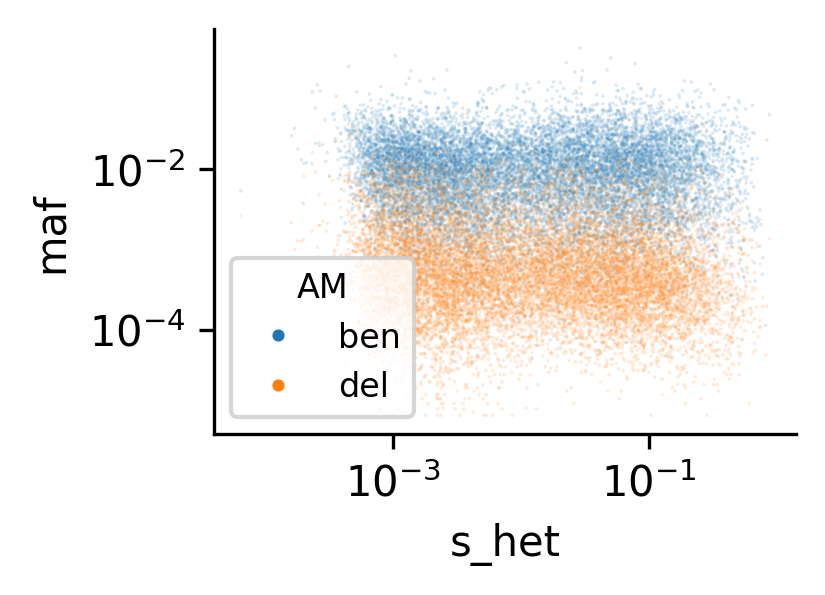

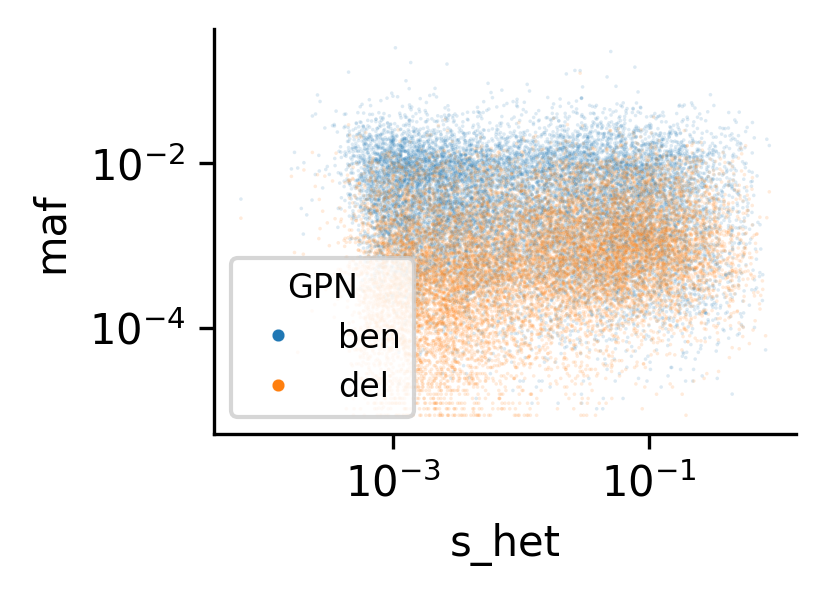

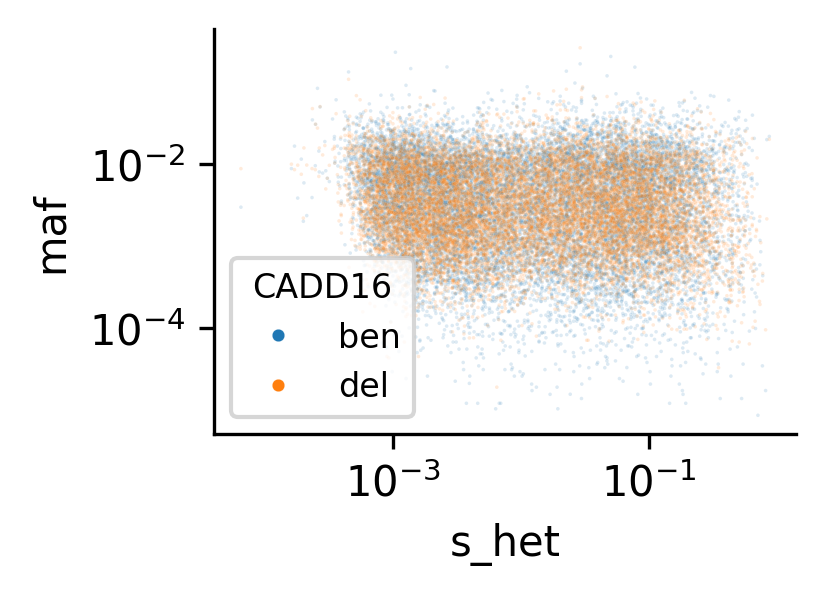

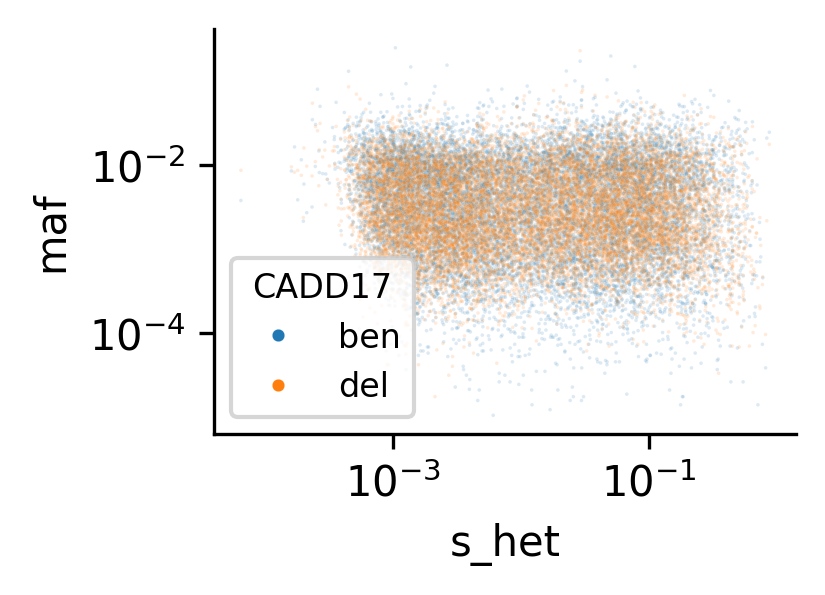

In [38]:
for a in ANNO_ORDER:
    plt.figure(figsize=(2.5, 1.75));
    sns.scatterplot(
        data = pd.concat(
            (
                mafs[a][['ben','del']], 
                mafs['s_het']
            ), axis=1
        ).melt(id_vars='s_het', var_name=a, value_name='maf'),
        y = 'maf',
        x = 's_het',
        hue = a,
        s = 0.75, alpha=0.15,
    );

    plt.legend(fontsize=8, title=a, title_fontsize=8),
    l = plt.gca().get_legend();
    for lh in l.legend_handles:
        lh.set_alpha(1.0)
        lh.set_ms(3)
    
    plt.loglog();
    sns.despine();
    plt.show();

In [39]:
def inverse_normal_transform(x, c=0.5):
    # c is a pseudocount
    return scipy.stats.norm.ppf((x.rank() - c) / (x.count() - 2*c + 1))

In [40]:
vs.loc[
    (vs['maf'] > 0.001) & 
    (vs['coast_cadd16_score'] == 3) & 
    (vs[['coast_esm_score','coast_gpn_score','coast_am_score','coast_am_score']] < 3).all(axis=1)
,'gene_name'
].value_counts().index.intersection(
    df.loc[df['CADD16'] & ~df[['ESM1B','GPN','AM','AM']].any(axis=1), 'GENE'].value_counts().index
).shape
    

(69,)

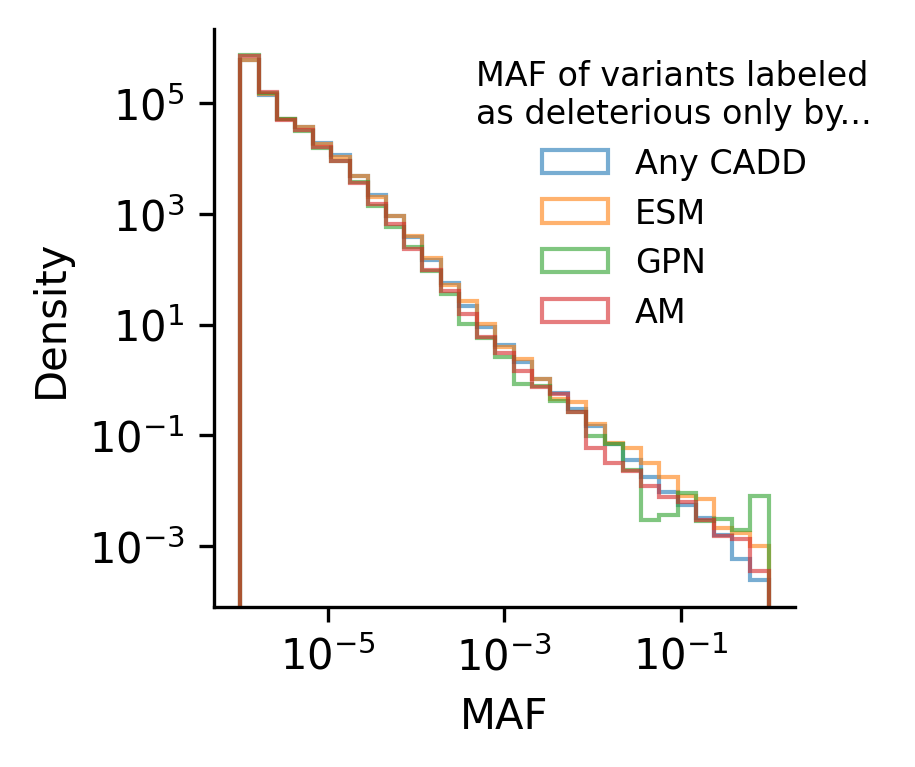

In [41]:
vs.loc[
    (vs[['coast_cadd16_score','coast_cadd17_score']] == 3).any(axis=1) & 
    (vs[['coast_esm_score','coast_gpn_score','coast_am_score']] < 3).all(axis=1)
,'maf'
].plot.hist(
    bins=np.geomspace(1e-6, 1e0, 30), 
    histtype='step',
    density=True,
    label='Any CADD',
    alpha=0.6
)

vs.loc[
    (vs[['coast_esm_score']] == 3).any(axis=1) & 
    (vs[['coast_gpn_score','coast_am_score','coast_cadd16_score','coast_cadd17_score']] < 3).all(axis=1)
,'maf'
].plot.hist(
    bins=np.geomspace(1e-6, 1e0, 30), 
    histtype='step',
    density=True,
    label='ESM',
    alpha=0.6
)

vs.loc[
    (vs[['coast_gpn_score']] == 3).any(axis=1) & 
    (vs[['coast_esm_score','coast_am_score','coast_cadd16_score','coast_cadd17_score']] < 3).all(axis=1)
,'maf'
].plot.hist(
    bins=np.geomspace(1e-6, 1e0, 30), 
    histtype='step',
    density=True,
    label='GPN',
    alpha=0.6
)

vs.loc[
    (vs[['coast_am_score']] == 3).any(axis=1) & 
    (vs[['coast_esm_score','coast_gpn_score','coast_cadd16_score','coast_cadd17_score']] < 3).all(axis=1)
,'maf'
].plot.hist(
    bins=np.geomspace(1e-6, 1e0, 30), 
    histtype='step',
    density=True,
    label='AM',
    alpha=0.6
)

plt.xlabel('MAF');
plt.ylabel('Density');
plt.loglog();
sns.despine();
plt.legend(fontsize=8, frameon=0, title_fontsize=8, title='MAF of variants labeled\nas deleterious only by...', bbox_to_anchor=(0.4, 1.0), loc='upper left');

In [42]:
scores = ['-esm1b_pred','am_pathogenicity', '-gpn', 'cadd16_phred','cadd17_phred','s_het','loeuf']

gene_id = vs.query(
    'mis'
).groupby(
    'gene_id'
).apply(
    lambda gp: dict(
        zip(
            scores, 
            np.median(
                gp[scores], 
                axis = 0
            )
        )
    ),
    include_groups = False
).apply(
    pd.Series
)

gene_id

,-esm1b_pred,am_pathogenicity,-gpn,cadd16_phred,cadd17_phred,s_het,loeuf
gene_id,,,,,,,
ENSG00000000419,8.1720,0.25970,7.010,23.700,23.800,0.019119,0.960
ENSG00000000457,4.7880,0.10170,5.790,22.700,21.200,0.016873,0.613
ENSG00000000460,3.7590,0.12210,4.930,20.800,19.300,0.002704,1.408
ENSG00000000938,6.5480,0.19660,6.430,23.500,24.200,0.038938,0.641
ENSG00000000971,4.7225,0.15190,3.020,15.535,14.030,0.033209,0.613
...,...,...,...,...,...,...,...
ENSG00000288867,7.6550,0.17770,5.190,19.180,15.960,NaN,1.835
ENSG00000289549,6.1835,0.10960,3.715,13.775,13.195,NaN,1.232
ENSG00000289604,3.8565,0.12285,3.245,13.265,13.395,NaN,NaN


# Fig6

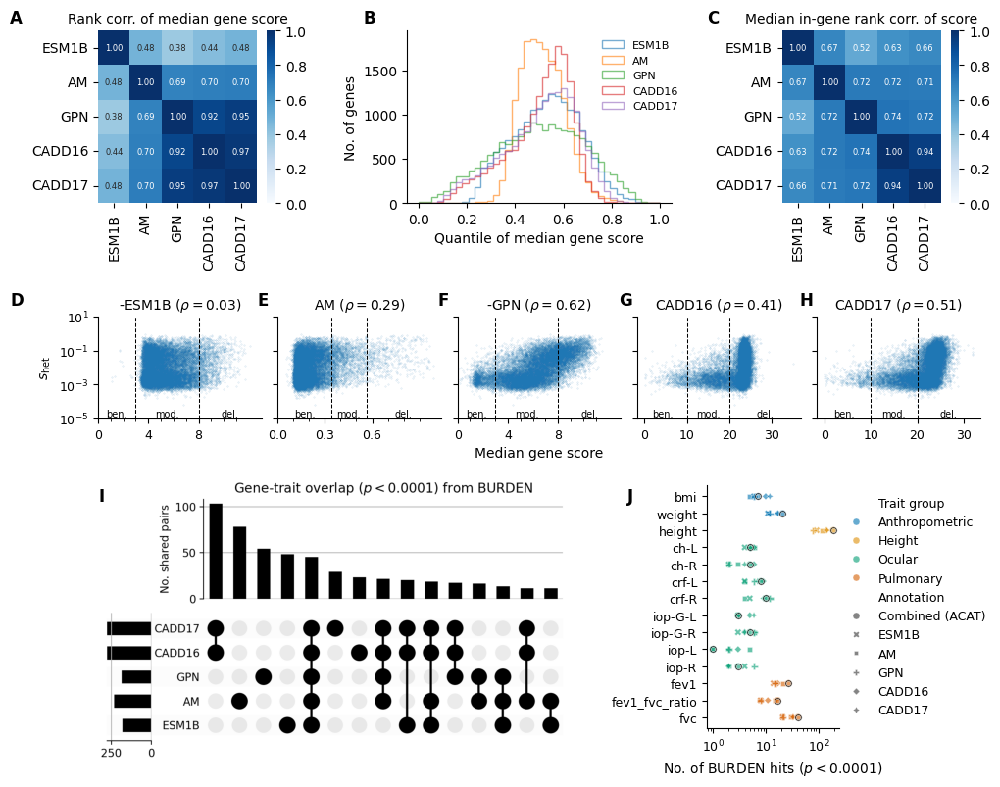

In [43]:
fig = plt.figure(figsize=(9, 8), dpi=100);

grid_1 = gs.GridSpec(1, 3, figure=fig, left=0.0, right=1.0, bottom=0.73, top=0.95, wspace=0.5, width_ratios=[0.3, 0.4, 0.3])
grid_2 = gs.GridSpec(1, 5, figure=fig, left=0.0, right=1.0, bottom=0.455, top=0.585, wspace=0.1);
grid_3a = gs.GridSpec(1, 1, figure=fig, left=-0.13, right=0.65, bottom=0.0, top=0.4)
grid_3b = gs.GridSpec(1, 1, figure=fig, left=0.69, right=0.84, bottom=0.06, top=0.37)


## heatmap
ax = fig.add_subplot(grid_1[2])

sns.heatmap(
    mean_in_gene_corr.rename(
        dict(zip(scores, ANNO_ORDER)), axis=0
    ).rename(
        dict(zip(scores, ANNO_ORDER)), axis=1
    ),
    cmap = 'Blues',
    vmin = 0, vmax = 1,
    annot=True, fmt=".2f", annot_kws={'size': 6},
    ax = ax
);

ax.set_title('Median in-gene rank corr. of score', y=1.0, fontsize=10);


## distribution of mean scores
ax = fig.add_subplot(grid_1[1])

mean_gene_scores.plot.hist(
    histtype = 'step', 
    bins = np.linspace(0, 1, 40), 
    alpha = 0.6, 
    linewidth = 1.0,
    ax = ax
)
plt.xlabel('Quantile of median gene score');
plt.ylabel('No. of genes');

plt.legend(ANNO_ORDER, fontsize=8, frameon=0, bbox_to_anchor=(0.7, 1.0), loc='upper left');
sns.despine(ax=ax);


## heatmap within gene
ax = fig.add_subplot(grid_1[0])

sns.heatmap(
    mean_gene_score_corrs.rename(
        dict(zip(ANNO_RANKS, ANNO_ORDER)), axis=0
    ).rename(
        dict(zip(ANNO_RANKS, ANNO_ORDER)), axis=1
    ),
    cmap = 'Blues', 
    vmin = 0, vmax = 1,
    annot=True, fmt=".2f", annot_kws={'size': 6},
);

ax.set_title('Rank corr. of median gene score', y=1.0, fontsize=10);



## correlations with s_het
for i,c in enumerate(gene_id.columns[:5]):
    ax = fig.add_subplot(grid_2[i])
    
    gene_id.plot.scatter(
        x = c,
        y = 's_het',
        # marker = '.',
        s = 0.07,
        alpha = 0.25,
        ax = ax,
        label = None, 
    );

    if '-' in c:
        ax.set_xlim(0, 13);

    annot = c.replace('-','').split('_')[0].split('1b')[0] + '_annot'
    
    t1,t2 = vs.loc[vs[annot] == 'mod', c.replace('-','')].apply(
        np.abs if '-' in c else lambda x: x
    ).quantile([0, 1]).values

    for t in [t1, t2]:
        ax.axvline(t, linewidth=0.75, color='k', linestyle='dashed');
    for x,s in zip([(ax.get_xlim()[0] + t1)/2, (t1 + t2)/2, (ax.get_xlim()[1] + t2)/2], ['ben.','mod.','del.']):
        ax.text(x, 1e-5, s, fontsize=7, ha='center', va='bottom');
    
    ax.set_title(
        '{0} ({1})'.format(
            c.split('_')[0].upper(),
            r'$\rho = {:.2f}$'.format(gene_id[[c, 's_het']].corr(method='spearman').iloc[0,1]), 
        ),
        fontsize=10,
    );
    ax.set_xlabel('Median gene score' if i == 2 else '', y=0.0);
    ax.set_xticks(
        {
            0: [0, 4, 8],
            1: [0., 0.3, 0.6],
            2: [0, 4, 8],
            3: [0, 10, 20, 30],
            4: [0, 10, 20, 30],
        }[i]
    );
    if i < 3:
        ax.set_xticks(np.arange(0.1, 1.0, 0.1) if i % 2 else np.arange(12), minor=True);
    ax.set_yscale('log');
    ax.set_ylim(1e-5, 1e1);
    if i == 0:
        ax.set_ylabel(r'$s_\text{het}$');
    else:
        ax.set_ylabel(''); ax.tick_params(labelleft=False);
    ax.tick_params(labelsize=9);
    
    sns.despine(ax = ax);



## upset plot
ax = fig.add_subplot(grid_3a[0])

ax.imshow(
    mpimg.imread('png/supplement/BURDEN_anno_intersect.png'),
    aspect = 'equal',
)
ax.axis('off')


## ACAT
ax = fig.add_subplot(grid_3b[0])

for test in ['BURDEN']:
    sns.scatterplot(
        data = pd.DataFrame(
            {
                anno: sig_cts.xs(test, level=1)[anno] for anno in sig_cts
            } | {
                'Combined (ACAT)': acat.T.xs(test, level=1).T[0],
                'Trait group': pd.Series(pheno_groups)
            }
        ).reset_index().rename({'index':'Trait'}, axis=1).melt(
            id_vars = ['Trait', 'Trait group'], 
            value_vars = ANNO_ORDER + ['Combined (ACAT)'], 
            var_name = 'Annotation', 
            value_name = 'No. of hits'
        ).sort_values(['Trait group','Annotation']),
        y = 'Trait',
        x = 'No. of hits',
        style = 'Annotation',
        style_order = ['Combined (ACAT)'] + ANNO_ORDER,
        hue='Trait group',
        palette = 'colorblind',
        alpha = 0.6,
        s = 25,
        ax = ax
    )

    sns.scatterplot(
        data = pd.DataFrame(
            {
                'ACAT': acat.T.xs(test, level=1).T[0],
                'Trait group': pd.Series(pheno_groups)
            }
        ).reset_index().rename({'index':'Trait'}, axis=1).melt(
            id_vars = ['Trait', 'Trait group'], 
            value_vars = ['ACAT'], 
            var_name = 'Annotation', 
            value_name = 'No. of hits'
        ).sort_values(['Trait group','Annotation']),
        y = 'Trait',
        x = 'No. of hits',
        color = 'k',
        alpha = 0.7,
        marker = r'$\circ$',
        s = 28,
        legend = False,
        ax = ax
    )
    ax.set_xlabel('No. of BURDEN hits ({})'.format(r'$p < 0.0001$'));
    ax.set_ylabel(''); 
    ax.tick_params(axis='both', labelsize=9)

    ax.legend(frameon=0, fontsize=9, bbox_to_anchor=(0.95,0.5), loc='center left')
    ax.semilogx();

sns.despine(ax=ax)


for i,A in enumerate('ABCDEFGHIJ'):
    fig.text(
        x = [
            -0.1, 0.3, 0.69,
            -0.1, 0.18, 0.385, 0.59, 0.795,
             0.0, 0.6,
        ][i],
        y = [
            0.96, 0.96, 0.96,
            0.6, 0.6, 0.6, 0.6, 0.6,
            0.35, 0.35
        ][i],
        s = A,
        fontsize = 12,
        fontweight = 'bold',
    )
              
fig.savefig('png/Fig6.png', bbox_inches='tight', dpi=200);